In [ ]:
import networkx as nx
import itertools
import pandas as pd
import ast
import matplotlib.pyplot as plt


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Sprint 4/DSF-Sprint4-data.csv',index_col = 0)

In [ ]:
df.columns

Index(['id', 'title', 'company', 'location', 'date_posted', 'min_amount',
       'max_amount', 'is_remote', 'description', 'job', 'description_clean'],
      dtype='object')

In [ ]:
df_cleaned = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Sprint 4/sprint4_clean.csv')

In [ ]:
df_cleaned.duplicated().value_counts()

,count
False,11456


In [ ]:
df_cleaned.head()

,id,title,company,location,date_posted,min_amount,max_amount,is_remote,job,description
0,in-a1452764f84ab159,Backend Developer,Glophics Web Design and Advertising Inc.,"Cebu City, P07, PH",2025-04-16,264757,335242,False,backend developer,"Your Duties and Responsibilities Indepth understanding of MVC, ObjectOriented Programming and experience with PHP Frameworks Codeigniter, Laravel and etc., Developing userfacing applications using Vue.js nuxt js Develop, bug fixing, improving application performance and maintain web projects Outline and communicate in detail any bugs or errors encountered in development. Basic knowledge of Linux commands and Amazon Web Services Proficient understanding of code versioning tool Git and Github Job Type Fulltime Pay Php20,000.00 Php30,000.00 per month Benefits Additional leave Company Christmas gift Company events Flexible schedule Health insurance Opportunities for promotion Paid training Pay raise Staff meals provided Schedule 8 hour shift Monday to Friday Supplemental Pay 13th month salary Overtime pay Application Questions Knowledgeable in PHPLARAVEL Expected Start Date 05202025"
1,in-d2ff9d59e4886004,Backend Developer,Atticus Solutions,"P00, PH",2025-04-15,0,0,False,backend developer,"We are looking for a Backend Developer who will participate in the entire application lifecycle and focus on coding and debugging, write clean codes to develop functional web applications, troubleshoot and debug applications, and perform UI tests to optimize performance. Responsibilities Develop and maintain robust backend services using Python, Flask, prioritizing performance, scalability, and security. Design, document, and implement RESTful APIs for seamless communication with frontend applications and thirdparty integrations. Champion the design and implementation of a microservices architecture for modularity, flexibility, and future platform growth. Lead the team in utilizing Docker and Kubernetes for efficient backend application deployment, scaling, and management. Collaborate with crossfunctional teams to translate product vision into technical solutions and drive backend roadmap execution. Mentor junior engineers on best practices and help them elevate their skills. Stay uptodate with the latest backend technologies and trends in REST APIs, microservices, and containerization. Qualifications Proven backend expertise 3 years designing, developing, and maintaining robust and scalable backend systems. Extensive experience with Python, including advanced concepts e.g., asynchronous programming, concurrency, and a deep understanding of the Flask framework, including RESTful API design and development. Solid experience with relational databases MySQL, PostgreSQL, including schema design, query optimization, and performance tuning. Practical experience with CICD pipelines e.g., GitHub Actions. A strong understanding of DevOps principles. Working knowledge of cloud platforms AWS, Google Cloud, including deploying and managing applications in cloud environments. Experience with Docker for containerization. Strong understanding of security best practices for backend systems, including authentication, authorization, and data encryption."
2,in-10cf2562cafb59b8,Front End Developer (ReactJS),Thakral One,PH,2025-04-15,0,0,False,backend developer,"Job Overview We are seeking skilled React.js Developer to join our dynamic team. The ideal candidate will have a strong foundation in JavaScript, SharePoint APIs, excellent problemsolving abilities, and a passion for building userfriendly web applications. Key Responsibilities Develop and maintain userfriendly web applications using React.js. Collaborate with designers and backend developers to create seamless, responsive user interfaces. Write clean, maintainable code and ensure the performance of applications. Participate in code reviews and contribute to team knowledge sharing. Debug and optimize applications for maximum speed and scalability. Stay updated with the lates

In [ ]:
df_cleaned['job'].value_counts().head(10)

,count
job,
UI,1000
database,1000
cybersecurity,948
UX,894
it support,816
software engineer,697
data analyst,674
business intelligence,670
machine learning,484


In [ ]:
  df_cleaned['location'].value_counts().head(10)

,count
location,
"Taguig, P00, PH",1755
"Makati, P00, PH",1640
"Manila, P00, PH",1300
"Pasig, P00, PH",824
"Work from Home, PH",811
"Quezon City, P00, PH",726
"Cebu City, P07, PH",613
PH,575
"Mandaluyong, P00, PH",420


In [ ]:
df_cleaned[df_cleaned['location'] == '04A, PH']


id  \
117    in-734e4820f4bbe7f2   
217    in-8457b4c9e326dccf   
218    in-8d67767ca4a0e07f   
228    in-6ac7ae9e4f5f3b3a   
230    in-177634b147299736   
385    in-8aaf0a08f1138434   
391    in-1b2a614de673befe   
809    in-eb4e468a0e96ded6   
1512   in-8457b4c9e326dccf   
1514   in-8d67767ca4a0e07f   
2097   in-8d67767ca4a0e07f   
2121   in-6ac7ae9e4f5f3b3a   
2139   in-177634b147299736   
2956   in-d0c1c452a7db826e   
3749   in-ef2e2a7f53b32d3b   
4307   in-d1532906a2f1c6df   
4351   in-d0c1c452a7db826e   
4498   in-3cf2ad80377dc2d6   
4517   in-8aaf0a08f1138434   
4524   in-1b2a614de673befe   
4641   in-61be8f0b74fd5b95   
4642   in-fcbe233300412904   
4661   in-ac53a0b505cba13a   
4662   in-4d205efbc6f29b2d   
4807   in-62bb30bb93197922   
4883   in-eb4e468a0e96ded6   
4925   in-a06c6cbc1c9b7a18   
5342   in-6ac7ae9e4f5f3b3a   
5478   in-c1a82b48ee76e17d   
5578   in-3139088b428201e0   
6035   in-27d87387025e3277   
6065   in-a790bae6a87e2d12   
6067   in-27f4a7b85db39eb3   
6164   in-979a68be698bdd56   
6838   in-27f4a7b85db39eb3   
6937   in-8d67767ca4a0e07f   
7755   in-241b766744b9ebe5   
7829   in-2cb185745d68fe40   
7831   in-d1532906a2f1c6df   
7856   in-0f3a8c1b538703df   
8179   in-10073347d7bfb470   
8219   in-3ee101001da8124a   
8224   in-1226291bf1eb8b9d   
8225   in-3b65b4bfe03f6b2b   
8226   in-0a64002521b2a4b3   
8265   in-0847cd63a653fba9   
8266   in-d568b7621d4f7f89   
8320   in-a16e9284d8c5d71f   
9517   in-66fa46b252b9cb7b   
9905   in-d0c1c452a7db826e   
10706  in-8d67767ca4a0e07f   
10734  in-6ac7ae9e4f5f3b3a   
10750  in-177634b147299736   

                                                                                       title  \
117                                                                   Java Backend developer   
217                                Senior Software Developer (Python//AWS | Onsite | Laguna)   
218                                                    Software Engineer Lead | AWS & Python   
228                                                                  Lead AWS Cloud Engineer   
230                                                         Senior Software Development Lead   
385                                                  IT Team Leader (Onsite, Rizal & Quezon)   
391                                                          IT Team Leader (Onsite, Laguna)   
809                                                                                  IT Head   
1512                               Senior Software Developer (Python//AWS | Onsite | Laguna)   
1514                                                   Software Engineer Lead | AWS & Python   
2097                                                   Software Engineer Lead | AWS & Python   
2121                                                                 Lead AWS Cloud Engineer   
2139                                                        Senior Software Development Lead   
2956                                                             Data and Analytics Director   
3749                                                       Spanish Web Management Specialist   
4307                                                                        Business Analyst   
4351                                                             Data and Analytics Director   
4498                                                                   IT Associate - Laguna   
4517                                                 IT Team Leader (Onsite, Rizal & Quezon)   
4524                                                         IT Team Leader (Onsite, Laguna)   
4641                                                    Head of Finance - Onsite until Probi   
4642                                                     Head of People and Culture - Onsite   
4661                                                                         Head of Finance   
4662                                                                    Head of P&C Services   
480

In [ ]:
df_cleaned[df_cleaned['location'].str.contains('04A, PH', na=False)]


,id,title,company,location,date_posted,min_amount,max_amount,is_remote,job,description
24,in-f7789724d5b08ca7,Backend Developer,Sheehan Inc.,"San Pablo City, 04A, PH",2025-04-09,199671,252828,False,backend developer,"Candidates must be graduates of Computer Engineering, Computer Science, or any related courses. Essential Skills Knowledge on serverside rendering, using technologies like Node.js, Ruby on Rails, or Django. Familiarity with database management systems like MySQL, PostgreSQL, or MongoDB Knowledge of RESTful APIs and JSON data exchange Understanding of serverside rendering and templating engines like EJS or Handlebars. Advantage if with backgroud knowledge on the following Understanding HTML structure and semantics Mastering CSS selectors, properties, and values Writing JavaScript code for dynamic effects and interactions Using package managers like npm and Yarn Familiarity with module bundlers and build tools like Webpack, Gulp, or Parcel Job Types Fulltime, Permanent Pay Php905.00 per day Benefits Paid training Pay raise Schedule Day shift Supplemental Pay 13th month salary Overtime pay Performance bonus Application Questions Did you do any work or project on server side rendering Did you do any work or had any project on server side rendering What is it Did you do any work or had any project on database management What is it Education Bachelor's Required Experience Backend Developer 1 year Preferred Work Location In person"
117,in-734e4820f4bbe7f2,Java Backend developer,Viventis Search Asia,"04A, PH",2025-02-19,1906255,2413744,False,backend developer,"Job Title Senior Backend Java Developer Position Summary We are seeking an experienced and motivated Senior Backend Java Developer to join our dynamic team. The ideal candidate will possess a proven track record of designing, developing, and maintaining scalable, highperformance backend applications. If you excel in Java development, thrive in a collaborative environment, and have a passion for tackling complex technical challenges, we want to hear from you Key Responsibilities Development Design, develop, and maintain robust backend services using Java and Spring BootSpring Cloud. Ensure the implementation of best practices for coding, security, and performance. Collaboration and Leadership Actively participate in Agile ceremonies e.g., sprint planning, standups, retrospectives. Contribute to teamwide continuous improvement initiatives. Technical Problem Solving Analyze, troubleshoot, and resolve complex technical issues across the backend stack. Collaborate with crossfunctional teams to ensure seamless integration and deployment processes. Qualifications Experience 57 years of professional experience in Java backend development, with a focus on building scalable applications. Handson experience with Spring Boot and Spring Cloud . Expertise in APIrelated technologies, including JSON , REST , Swagger , and tools such as Postman . Technical Skills Proficiency in Java, Spring Boot , and RESTful API development . Experience with IAM concepts such as SSO, OAuth 2.0, and OpenID Connect. Familiarity with CICD tools such as Bitbucket. Knowledge of AWS is a plus. Strong understanding of relational databases. Preferred Qualifications Experience with microservices architecture. Certifications in Java, or cloud technologies. Experience with AgileScrum methodologies. Experience with developing custom Keycloak extensions. Job Type Fulltime Pay Up to Php180,000.00 per month Benefits Flexible schedule Schedule 8 hour shift Ability to commuterelocate Laguna Reliably commute or planning to relocate before starting work Preferred Work Location In person"
167,in-8932f73d86c01e59,Java DevOps Engineer | Onsite in Imus Cavite,CallMax Solutions,"Imus, 04A, PH",2025-04-16,0,0,False,devops engineer,"For faster process, Kindly send your Resume to APPLYCALLMAXSOLUTIONS.COM and Indicate ""Java Developer Application"" to the Email Subject Technical Skills Qualifications Strong proficiency in Ja

In [ ]:
df_cleaned['min_amount'] = df_cleaned['min_amount'].astype(int)
pd.options.display.float_format = '{:.0f}'.format


In [ ]:
df_cleaned.groupby('location')['min_amount'].mean().sort_values(ascending=False).head(10)


,min_amount
location,
"Pasong Tamo, P00, PH",2118061
"Manila Central Post Office, P00, PH",868253
"Ugong Norte, P00, PH",635418
"E. Rodriguez, P00, PH",608942
"Balanga, P03, PH",608942
"04A, PH",573739
"Ugong, P00, PH",489801
"Santa Cruz, P00, PH",487595
"Cabuyao, 04A, PH",486432


In [ ]:
df_cleaned.groupby('location')['max_amount'].mean().head(10)

,max_amount
location,
"04A, PH",726482
"Alabang, P00, PH",298124
"Angeles, P03, PH",476021
"Angono, 04A, PH",274898
"Antipolo, 04A, PH",580578
"Ayala Alabang Subdivision, P00, PH",442519
"Ayala Avenue-Paseo de Roxas, P00, PH",262606
"Bacolod, P06, PH",102808
"Bacoor, 04A, PH",129627


In [ ]:
df_cleaned['average_salary'] = (df['max_amount'] + df['min_amount'])/2

In [ ]:
avg_salary = (
    df_cleaned.groupby('location', as_index=False)['average_salary']
    .mean()
    .sort_values(by='average_salary', ascending=False)
)
avg_salary.head(10)


,location,average_salary
146,"Pasong Tamo, P00, PH",2400000
137,PH,1133224
0,"04A, PH",1111479
102,"Manila Central Post Office, P00, PH",983827
61,"Fort Bonifacio, P00, PH",932222
220,"Work from Home, PH",883377
4,"Antipolo, 04A, PH",879229
202,"Taguig, P00, PH",869663
208,"Tarlac City, P03, PH",866000
103,"Manila, P00, PH",852106


In [ ]:
df_cleaned[df_cleaned['location'] == 'PH']


,id,title,company,location,date_posted,min_amount,max_amount,is_remote,job,description,average_salary
2,in-10cf2562cafb59b8,Front End Developer (ReactJS),Thakral One,PH,2025-04-15,0,0,False,backend developer,"Job Overview We are seeking skilled React.js Developer to join our dynamic team. The ideal candidate will have a strong foundation in JavaScript, SharePoint APIs, excellent problemsolving abilities, and a passion for building userfriendly web applications. Key Responsibilities Develop and maintain userfriendly web applications using React.js. Collaborate with designers and backend developers to create seamless, responsive user interfaces. Write clean, maintainable code and ensure the performance of applications. Participate in code reviews and contribute to team knowledge sharing. Debug and optimize applications for maximum speed and scalability. Stay updated with the latest industry trends and best practices in web development. Qualifications Bachelors degree in computer science, Engineering, or related field. Minimum 4 years experience as a React.js Developer or similar role. Strong proficiency in JavaScript, Typescript, HTML, and CSS. Experience with state management libraries e.g., Redux, MobX. Experience with Component Based design libraires such as Material UI or alike Familiarity with RESTful APIs and asynchronous request handling Understanding of responsive design principles and mobilefirst development. Knowledge of version control systems e.g., Git. Experience in handling SharePoint projects is highly preferred Excellent communication skills and ability to work in a team environment. Good to have Python Scripting Exp. Azure DevOps Exp. Unix CLI Exp.",NaN
42,in-441a5fbd0f00830d,Backend Developer,iBayad Online Ventures,PH,2025-04-04,0,0,False,backend developer,"We are looking for a highly skilled Backend Developer with expertise in Java, Spring Boot, and Spring MVC to develop and maintain robust, secure, and scalable backend systems. The ideal candidate should have deep experience with Maven, JPAHibernate, and strong knowledge of Oracle and PostgreSQL databases. The candidate should also have a working knowledge of modern backend technologies and infrastructure, with Redis, Kafka, queueing systems, and basic Linux server management as nicetohave skills. Responsibilities Core Backend Development Design, develop, and maintain scalable RESTful APIs using Spring Boot and Spring MVC. Implement and manage database interactions using JPAHibernate with Oracle and PostgreSQL as primary databases. Develop and maintain secure and efficient backend services that follow industry best practices. Write clean, modular, and maintainable code with appropriate unit tests and documentation. Database and ORM Management Optimize SQL queries and ensure high performance across large datasets. Design and manage relational database schemas, indexes, and data models. Implement data migration, ETL pipelines, and backup strategies. Application Security and Optimization Apply best practices for application security e.g., preventing SQL injection, CSRF, XSS. Implement API authentication and authorization mechanisms, including JWT and OAuth. Monitor and optimize application performance and database queries. API and Integration Develop APIs for seamless integration with frontend applications and thirdparty services. Design and implement eventdriven architectures using Kafka or other messaging queues. Job Type Fulltime Benefits Opportunities for promotion Supplemental Pay 13th month salary Performance bonus Work Location In person Expected Start Date 05052025",NaN
53,in-a2d7742c81390d85,Backend Developer (Laravel API Specialist) | Freelance | Fully Remote,Sirvez,PH,2025-04-01,741321,938678,True,backend developer,"About Us We're a premium web application that transforms complex business challenges into elegant digital solutions. Enterprisegrade application, scalable cloud infrastructure using cuttingedge technologies like Laravel, Next.js, and AWS. 

In [ ]:
df['title'].value_counts().sort_values(ascending=False).head(50)

,count
title,
Data Analyst,216
Data Engineer,149
Software Engineer,110
Full Stack Developer,104
UI/UX Designer,86
Web Developer,84
DevOps Engineer,81
Software Developer,75
IT Compliance,71


In [ ]:
df[df['title'].str.contains('Engineer', case=False, na=False)]


id  \
58     in-aac53df66c1f814d   
65     in-679e6c9b2b83b844   
69     in-5ceb8c99c09726a0   
80     in-a36b86fa751f499b   
82     in-49e110e4107643fe   
...                    ...   
11418  in-be1b0a72a96f952f   
11427  in-978dd8291a457f98   
11442  in-f84b601e53d04676   
11443  in-665c833cefda9ce4   
11448  in-8f25a3f90747ce77   

                                                        title  \
58                      Software Engineer (Backend Developer)   
65                           Senior Backend Engineer (Remote)   
69                              Backend Engineer Senior (PHP)   
80                              PHP Backend Engineer (Senior)   
82                             Senior Backend Engineer (Cebu)   
...                                                       ...   
11418                  Frontend Engineer (AU Client - Remote)   
11427  (Senior) Frontend Software Engineer (Coreless Banking)   
11442                    Product Engineering, Lead Specialist   
11443        Backend Engineer, Digital Venture - Fully REMOTE   
11448                                       Software Engineer   

                        company              location date_posted  min_amount  \
58        TechTiera Corporation       Malate, P00, PH  2025-03-31      397136   
65                    ICHS-Hire       Manila, P00, PH  2025-03-28     1588546   
69                 Station Five       Taguig, P00, PH  2025-03-27         NaN   
80                 Station Five       Taguig, P00, PH  2025-03-25         NaN   
82               StackTrek Inc.    Cebu City, P07, PH  2025-03-24         NaN   
...                         ...                   ...         ...         ...   
11418  Outsource Broker Support  Mandaluyong, P00, PH  2025-03-18     1535594   
11427                    Avaloq       Makati, P00, PH  2025-02-21         NaN   
11442                    Strada  Quezon City, P00, PH  2024-10-17         NaN   
11443                 makro pro    Work from Home, PH  2024-10-17         NaN   
11448           August 99, Inc.        Pasig, P00, PH  2022-05-31         NaN   

       max_amount  is_remote  \
58         502863      False   
65        2011453      False   
69            NaN       True   
80            NaN       True   
82            NaN       True   
...           ...        ...   
11418     1944405       True   
11427         NaN      False   
11442         NaN      False   
11443         NaN       True   
11448         NaN       True   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

In [ ]:
top_avesalary = df_cleaned.groupby('title', as_index=False)['average_salary'].mean().sort_values(by = 'average_salary', ascending = False).head(15)

In [ ]:

pd.set_option('display.max_colwidth', None)
top_avesalary

,title,average_salary
1417,Director Data Engineering (WFH),3600000
2218,IT Operations Director,3600000
1416,Director Data Engineering,3600000
186,Actuarial Analytics Manager,3360000
4870,Sr. Full Stack Developer-REMOTE,3300000
716,Chief Financial Officer,3120000
4191,"Senior Full Stack Developer Php165,000 - Php330,000//month (BGC ON SITE)",2970000
4144,"Senior Developer (React, Node.js, AI, Python) Php165,000 - Php330,000//month (Cebu ON SITE)",2970000
2038,"Head of Software Engineering Division (Hybrid, Cebu)",2880000
4466,Senior Telecommunications Software Engineer (Docker & Kubernetes Tools),2700000


In [ ]:

top_avesalary['title'] = top_avesalary['title'].replace({
    'Senior Full Stack Developer Php165,000 - Php330,000//month (BGC ON SITE)': 'Senior Full Stack Developer',
    'Senior Developer (React, Node.js, AI, Python) Php165,000 - Php330,000//month (Cebu ON SITE)': 'Senior Developer',
    'Head of Software Engineering Division (Hybrid, Cebu)': 'Head of Software Engineering Division',
    'Senior Telecommunications Software Engineer (Docker & Kubernetes Tools)':'Senior Telecommunications Software Engineer'
})


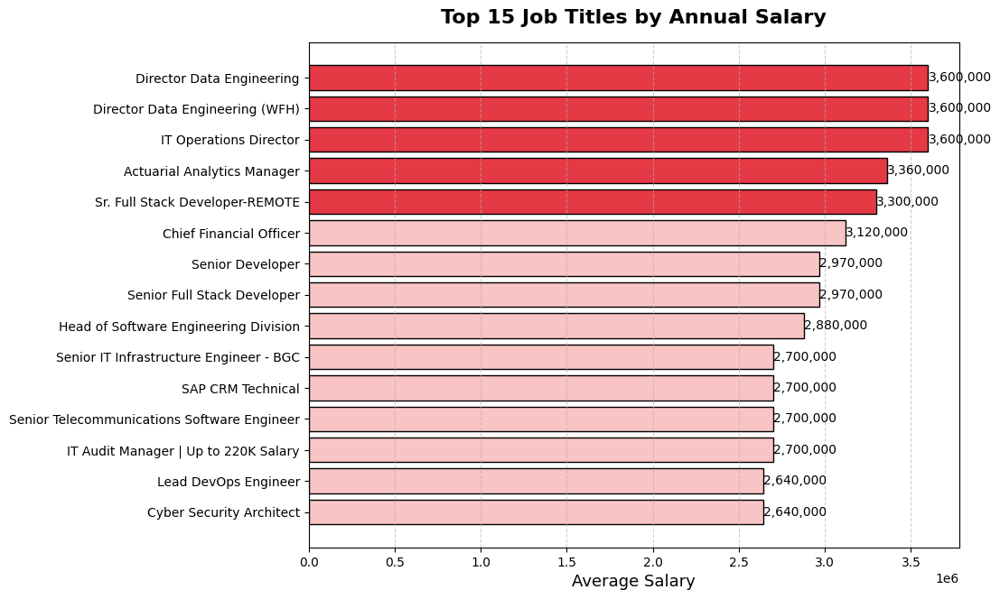

In [ ]:
import matplotlib.pyplot as plt

# Sort data so lower salaries are at the bottom, higher on top
top_avesalary = top_avesalary.sort_values(by='average_salary', ascending=True)

# Create color list: bright red for top 5, faded red for others
colors = ['#F8C4C4'] * len(top_avesalary)
colors[-5:] = ['#E63946'] * 5  # Top 5 in bright red

# Create figure
plt.figure(figsize=(12, 7))

# Plot horizontal bars
plt.barh(top_avesalary['title'], top_avesalary['average_salary'], color=colors, edgecolor='black')

# Title and labels
plt.title('Top 15 Job Titles by Annual Salary', fontsize=16, weight='bold', pad=15)
plt.xlabel('Average Salary', fontsize=13)
plt.ylabel('')
plt.grid(axis='x', linestyle='--', alpha=0.6)

# Add labels beside each bar
for i, v in enumerate(top_avesalary['average_salary']):
    plt.text(v + 50, i, f'{v:,.0f}', va='center', fontsize=10)

# Adjust spacing to fit text
plt.subplots_adjust(left=0.35, right=0.95, top=0.9, bottom=0.1)

plt.show()


In [ ]:
df['is_remote'].value_counts()

,count
is_remote,
False,8164
True,3292


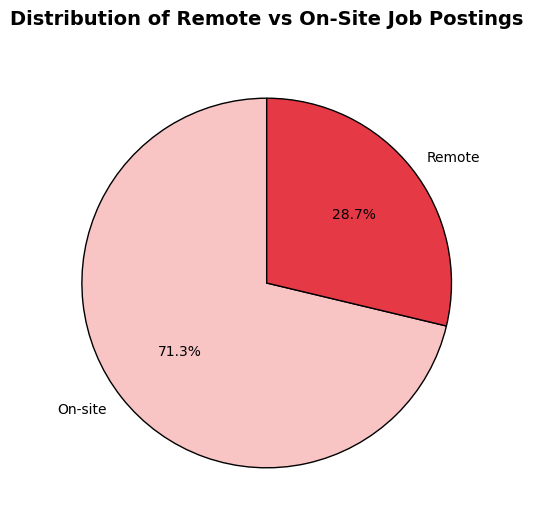

In [ ]:
import matplotlib.pyplot as plt

# Count remote vs non-remote
remote_counts = df['is_remote'].value_counts()

# Create pie chart
plt.figure(figsize=(6, 6))
plt.pie(
    remote_counts,
    labels=['On-site', 'Remote'],        # Adjust label order if reversed
    autopct='%1.1f%%',                   # Show percentage
    startangle=90,                       # Start from top
    colors=['#F8C4C4', '#E63946'],       # Faded red and bright red
    wedgeprops={'edgecolor': 'black'}
)

plt.title('Distribution of Remote vs On-Site Job Postings', fontsize=14, weight='bold', pad=20)
plt.show()


In [ ]:
df_aap = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Sprint 4/job_descriptions_with_extracted_skills_2.csv')

In [ ]:
df_aap['extracted_skills']

,extracted_skills
0,"['Digital Fluency', 'Applications Development', 'Cloud Computing', 'Continuous Integration and Continuous Deployment', 'Software Testing', 'Problem Solving', 'Learning Agility', 'Developing People', 'Communication', 'Self Management']"
1,"['Digital Fluency', 'Applications Development', 'Software Design', 'Systems Design', 'Cloud Computing', 'Continuous Integration and Continuous Deployment', 'Database Administration', 'Software Testing', 'Security Architecture', 'Problem Solving']"
2,"['Digital Fluency', 'Applications Development', 'Software Design', 'Systems Design', 'Cloud Computing', 'Continuous Integration and Continuous Deployment', 'Software Testing', 'Problem Solving', 'Collaboration', 'Learning Agility']"
3,"['Digital Fluency', 'Applications Development', 'Software Design', 'Systems Design', 'Cloud Computing', 'Continuous Integration and Continuous Deployment', 'Software Testing', 'Problem Solving', 'Collaboration', 'Learning Agility']"
4,"['Digital Fluency', 'Applications Development', 'Software Design', 'Systems Design', 'Continuous Integration and Continuous Deployment', 'Software Testing', 'Security Architecture', 'Problem Solving', 'Collaboration', 'Self Management']"
...,...
11451,"['Digital Fluency', 'Applications Development', 'Software Design', 'Continuous Integration and Continuous Deployment', 'Collaboration', 'Developing People', 'Communication']"
11452,"['Digital Fluency', 'Applications Development', 'Continuous Integration and Continuous Deployment', 'Database Administration', 'Software Testing']"
11453,"['Digital Fluency', 'Applications Development', 'Software Design', 'Systems Design', 'Continuous Integration and Continuous Deployment', 'Software Testing', 'Security Architecture', 'Stakeholder Management']"
11454,"['Digital Fluency', 'Applications Development', 'Software Design', 'Continuous Integration and Continuous Deployment', 'Collaboration', 'Developing People', 'Communication', 'Self Management']"


In [ ]:
import pandas as pd
import itertools
import ast

# 1️⃣ Convert the string representation into real lists
df_aap['extracted_skills'] = df_aap['extracted_skills'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# 2️⃣ Create a list to store all edges
edges = []

# 3️⃣ Loop through each row and generate all unique skill pairs
for skill_list in df_aap['extracted_skills']:
    if isinstance(skill_list, list) and len(skill_list) > 1:
        # Generate all 2-combinations of skills within the same job post
        pairs = list(itertools.combinations(sorted(set(skill_list)), 2))
        edges.extend(pairs)

# 4️⃣ Convert the list of tuples into a DataFrame
df_edges_hasduplicates= pd.DataFrame(edges, columns=['source', 'target'])


df_edges_hasduplicates.head()


,source,target
0,Applications Development,Cloud Computing
1,Applications Development,Communication
2,Applications Development,Continuous Integration and Continuous Deployment
3,Applications Development,Developing People
4,Applications Development,Digital Fluency


In [ ]:
df_edges_hasduplicates.shape

(313820, 2)

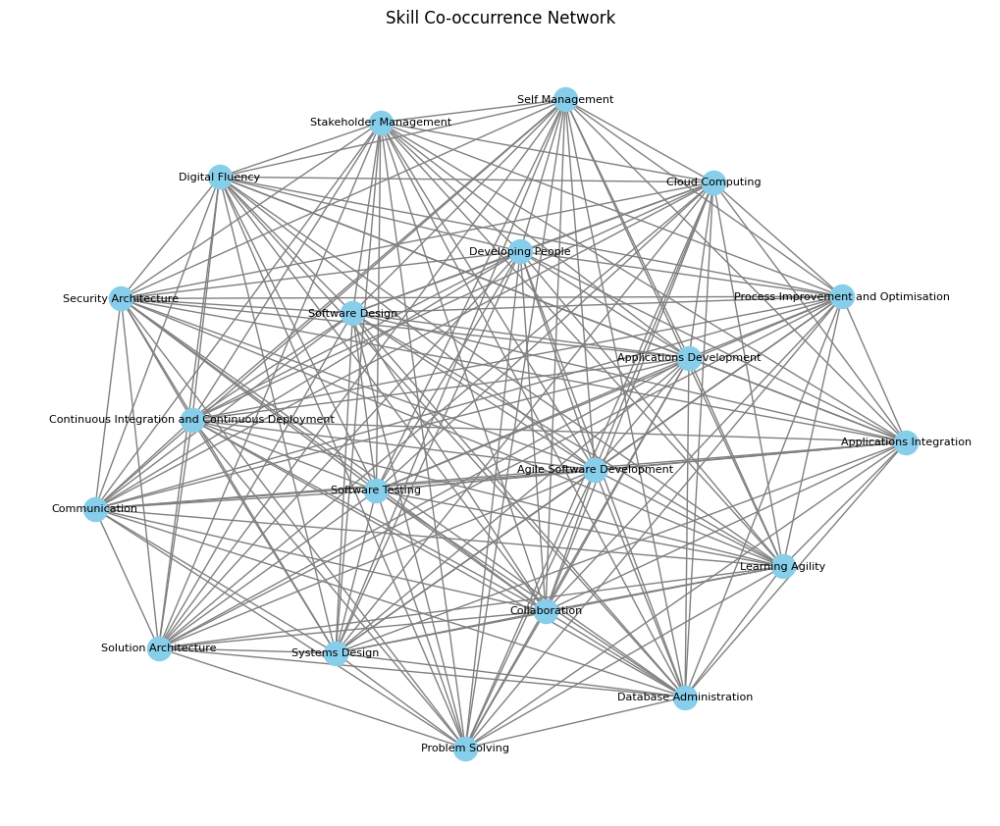

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# 1️⃣ Build the graph from your edges DataFrame
G_dup = nx.from_pandas_edgelist(df_edges_hasduplicates, source='source', target='target')

# 2️⃣ Plot the network
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G_dup, k=0.3, seed=42)  # Layout for better spacing
nx.draw(
    G_dup,
    pos,
    with_labels=True,
    node_size=300,
    node_color='skyblue',
    edge_color='gray',
    font_size=8
)
plt.title("Skill Co-occurrence Network")
plt.show()


In [ ]:
import pandas as pd
import itertools
import ast

# 1️⃣ Convert the string representation into real lists
df_aap['extracted_skills'] = df_aap['extracted_skills'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# 2️⃣ Create a list to store all edges
edges = []

# 3️⃣ Loop through each row and generate all unique skill pairs
for skill_list in df_aap['extracted_skills']:
    if isinstance(skill_list, list) and len(skill_list) > 1:
        # Generate all 2-combinations of skills within the same job post
        pairs = list(itertools.combinations(sorted(set(skill_list)), 2))
        edges.extend(pairs)

# 4️⃣ Convert the list of tuples into a DataFrame
df_edges = pd.DataFrame(edges, columns=['source', 'target'])

# 5️⃣ Optional: remove duplicate edges if order doesn’t matter
df_edges_noduplicates = df_edges.drop_duplicates().reset_index(drop=True)

df_edges_noduplicates.head()


,source,target
0,Applications Development,Cloud Computing
1,Applications Development,Communication
2,Applications Development,Continuous Integration and Continuous Deployment
3,Applications Development,Developing People
4,Applications Development,Digital Fluency


In [ ]:
df_edges_noduplicates.shape

(189, 2)

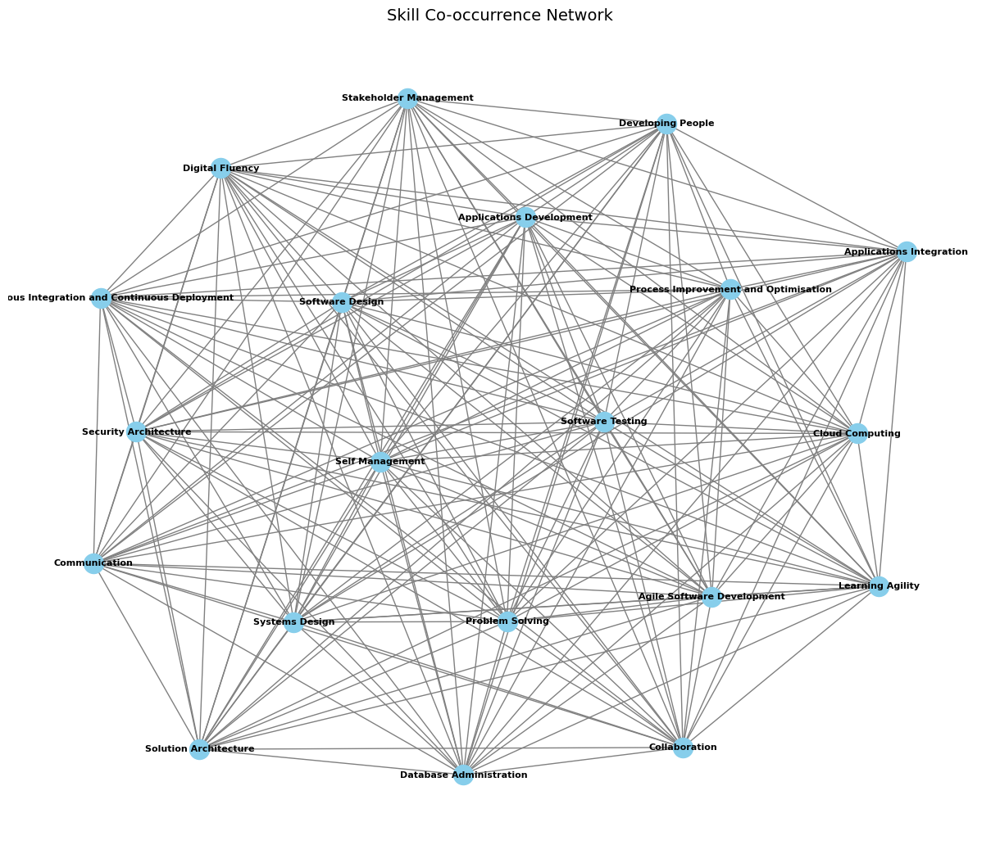

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# 1️⃣ Build the network graph from your dataframe
G_nodup = nx.from_pandas_edgelist(df_edges_noduplicates, source='source', target='target')

# 2️⃣ Configure layout for clear visualization
pos = nx.spring_layout(G_nodup, k=0.4, seed=42)  # You can adjust k for spacing

# 3️⃣ Draw the graph
plt.figure(figsize=(12, 10))
nx.draw(
    G_nodup,
    pos,
    with_labels=True,
    node_size=300,
    node_color='skyblue',
    edge_color='gray',
    font_size=8,
    font_weight='bold'
)

plt.title("Skill Co-occurrence Network", fontsize=14)
plt.show()


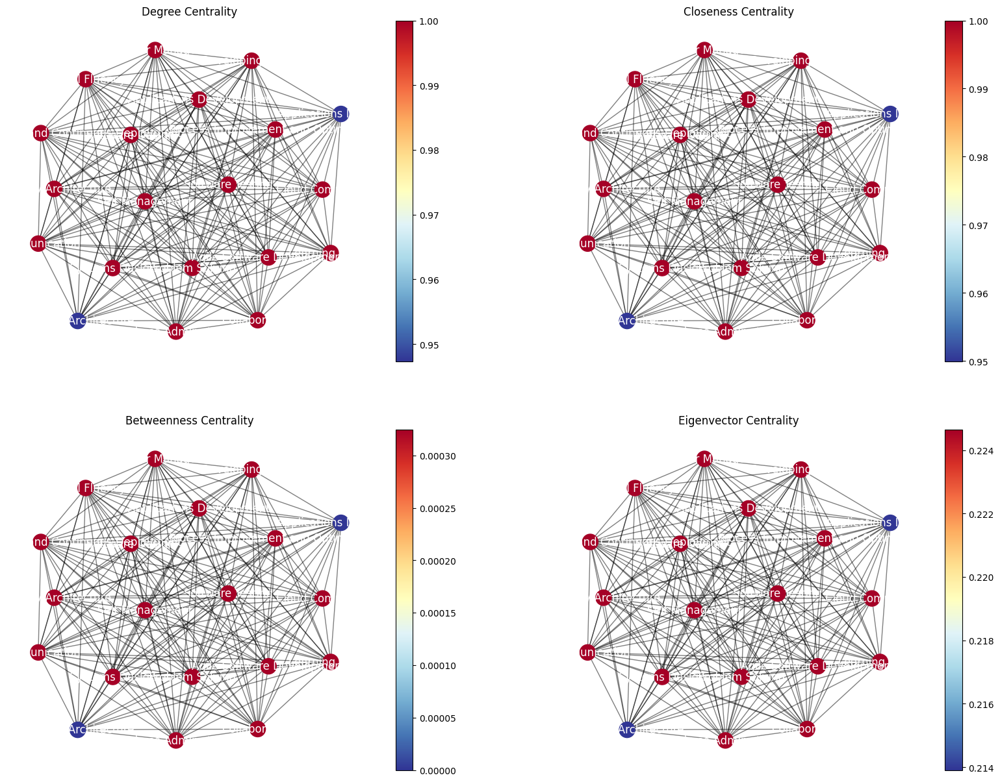

In [ ]:
fig = plt.figure(figsize=(20,15));

centralities = [list(nx.degree_centrality(G_dup).values()),
                list(nx.closeness_centrality(G_dup).values()),
                list(nx.betweenness_centrality(G_dup).values()),
                list(nx.eigenvector_centrality(G_dup).values())]

titles = ['Degree Centrality', 'Closeness Centrality',
          'Betweenness Centrality', 'Eigenvector Centrality']

for i in range(4):
    ax = fig.add_subplot(2, 2, i+1);
    nc = nx.draw_networkx_nodes(G_dup, pos, node_size=300, cmap=plt.cm.RdYlBu_r,
                            node_color=centralities[i]);
    nx.draw_networkx_edges(G_dup, pos, alpha=0.500);
    nx.draw_networkx_labels(G_dup, pos, font_color='white');
    plt.title(titles[i]);
    plt.axis('off');
    plt.colorbar(nc);

plt.show();


In [ ]:
import networkx as nx

# Compute all centralities
degree_centrality = nx.degree_centrality(G_dup)
betweenness = nx.betweenness_centrality(G_dup)
closeness = nx.closeness_centrality(G_dup)
eigenvector = nx.eigenvector_centrality(G_dup)

# Create a summary DataFrame
centrality_df = pd.DataFrame({
    'Skill': list(degree_centrality.keys()),
    'Degree Centrality': list(degree_centrality.values()),
    'Betweenness Centrality': list(betweenness.values()),
    'Closeness Centrality': list(closeness.values()),
    'Eigenvector Centrality': list(eigenvector.values())
})

# Sort by degree centrality (or any metric you prefer)
centrality_df = centrality_df.sort_values(by='Degree Centrality', ascending=False).reset_index(drop=True)

# Display top 10
print("📊 Centrality Measures of G (with duplicates):\n")
for i, row in centrality_df.head(10).iterrows():
    print(f"{i+1}. {row['Skill']}")
    print(f"   - Degree Centrality: {row['Degree Centrality']:.4f}")
    print(f"   - Betweenness Centrality: {row['Betweenness Centrality']:.4f}")
    print(f"   - Closeness Centrality: {row['Closeness Centrality']:.4f}")
    print(f"   - Eigenvector Centrality: {row['Eigenvector Centrality']:.4f}")
    print()


📊 Centrality Measures of G (with duplicates):

1. Applications Development
   - Degree Centrality: 1.0000
   - Betweenness Centrality: 0.0003
   - Closeness Centrality: 1.0000
   - Eigenvector Centrality: 0.2247

2. Cloud Computing
   - Degree Centrality: 1.0000
   - Betweenness Centrality: 0.0003
   - Closeness Centrality: 1.0000
   - Eigenvector Centrality: 0.2247

3. Communication
   - Degree Centrality: 1.0000
   - Betweenness Centrality: 0.0003
   - Closeness Centrality: 1.0000
   - Eigenvector Centrality: 0.2247

4. Continuous Integration and Continuous Deployment
   - Degree Centrality: 1.0000
   - Betweenness Centrality: 0.0003
   - Closeness Centrality: 1.0000
   - Eigenvector Centrality: 0.2247

5. Developing People
   - Degree Centrality: 1.0000
   - Betweenness Centrality: 0.0003
   - Closeness Centrality: 1.0000
   - Eigenvector Centrality: 0.2247

6. Digital Fluency
   - Degree Centrality: 1.0000
   - Betweenness Centrality: 0.0003
   - Closeness Centrality: 1.0000
   - E

In [ ]:
import networkx as nx
import pandas as pd

# Compute all centralities using G_nodup
degree_centrality = nx.degree_centrality(G_nodup)
betweenness = nx.betweenness_centrality(G_nodup)
closeness = nx.closeness_centrality(G_nodup)
eigenvector = nx.eigenvector_centrality(G_nodup)

# Create a summary DataFrame
centrality_df = pd.DataFrame({
    'Skill': list(degree_centrality.keys()),
    'Degree Centrality': list(degree_centrality.values()),
    'Betweenness Centrality': list(betweenness.values()),
    'Closeness Centrality': list(closeness.values()),
    'Eigenvector Centrality': list(eigenvector.values())
})

# Sort by Degree Centrality
centrality_df = centrality_df.sort_values(by='Degree Centrality', ascending=False).reset_index(drop=True)

# Display top 10 results
print("📊 Centrality Measures of G_nodup (Graph without duplicates):\n")
for i, row in centrality_df.head(10).iterrows():
    print(f"{i+1}. {row['Skill']}")
    print(f"   - Degree Centrality: {row['Degree Centrality']:.4f}")
    print(f"   - Betweenness Centrality: {row['Betweenness Centrality']:.4f}")
    print(f"   - Closeness Centrality: {row['Closeness Centrality']:.4f}")
    print(f"   - Eigenvector Centrality: {row['Eigenvector Centrality']:.4f}")
    print()


📊 Centrality Measures of G_nodup (Graph without duplicates):

1. Applications Development
   - Degree Centrality: 1.0000
   - Betweenness Centrality: 0.0003
   - Closeness Centrality: 1.0000
   - Eigenvector Centrality: 0.2247

2. Cloud Computing
   - Degree Centrality: 1.0000
   - Betweenness Centrality: 0.0003
   - Closeness Centrality: 1.0000
   - Eigenvector Centrality: 0.2247

3. Communication
   - Degree Centrality: 1.0000
   - Betweenness Centrality: 0.0003
   - Closeness Centrality: 1.0000
   - Eigenvector Centrality: 0.2247

4. Continuous Integration and Continuous Deployment
   - Degree Centrality: 1.0000
   - Betweenness Centrality: 0.0003
   - Closeness Centrality: 1.0000
   - Eigenvector Centrality: 0.2247

5. Developing People
   - Degree Centrality: 1.0000
   - Betweenness Centrality: 0.0003
   - Closeness Centrality: 1.0000
   - Eigenvector Centrality: 0.2247

6. Digital Fluency
   - Degree Centrality: 1.0000
   - Betweenness Centrality: 0.0003
   - Closeness Centrality

In [ ]:
import pandas as pd
import networkx as nx

# --- Compute centralities for G_dup ---
deg_dup = nx.degree_centrality(G_dup)
bet_dup = nx.betweenness_centrality(G_dup)
close_dup = nx.closeness_centrality(G_dup)
eig_dup = nx.eigenvector_centrality(G_dup)

df_dup = pd.DataFrame({
    'Skill': list(deg_dup.keys()),
    'Degree_dup': list(deg_dup.values()),
    'Betweenness_dup': list(bet_dup.values()),
    'Closeness_dup': list(close_dup.values()),
    'Eigenvector_dup': list(eig_dup.values())
})

# --- Compute centralities for G_nodup ---
deg_nodup = nx.degree_centrality(G_nodup)
bet_nodup = nx.betweenness_centrality(G_nodup)
close_nodup = nx.closeness_centrality(G_nodup)
eig_nodup = nx.eigenvector_centrality(G_nodup)

df_nodup = pd.DataFrame({
    'Skill': list(deg_nodup.keys()),
    'Degree_nodup': list(deg_nodup.values()),
    'Betweenness_nodup': list(bet_nodup.values()),
    'Closeness_nodup': list(close_nodup.values()),
    'Eigenvector_nodup': list(eig_nodup.values())
})

# --- Merge results side by side ---
df_compare = pd.merge(df_dup, df_nodup, on='Skill', how='inner')

# --- Compute difference for each metric (optional) ---
df_compare['Δ Degree'] = df_compare['Degree_dup'] - df_compare['Degree_nodup']
df_compare['Δ Betweenness'] = df_compare['Betweenness_dup'] - df_compare['Betweenness_nodup']
df_compare['Δ Closeness'] = df_compare['Closeness_dup'] - df_compare['Closeness_nodup']
df_compare['Δ Eigenvector'] = df_compare['Eigenvector_dup'] - df_compare['Eigenvector_nodup']

# --- Sort by Degree difference for visibility ---
df_compare = df_compare.sort_values(by='Δ Degree', ascending=False).reset_index(drop=True)

# --- Display top 10 ---
print("📊 Comparison of Centralities (G_dup vs G_nodup):")
display(df_compare.head(10))


📊 Comparison of Centralities (G_dup vs G_nodup):


,Skill,Degree_dup,Betweenness_dup,Closeness_dup,Eigenvector_dup,Degree_nodup,Betweenness_nodup,Closeness_nodup,Eigenvector_nodup,Δ Degree,Δ Betweenness,Δ Closeness,Δ Eigenvector
0,Applications Development,1,0,1,0,1,0,1,0,0,0,0,0
1,Cloud Computing,1,0,1,0,1,0,1,0,0,0,0,0
2,Communication,1,0,1,0,1,0,1,0,0,0,0,0
3,Continuous Integration and Continuous Deployment,1,0,1,0,1,0,1,0,0,0,0,0
4,Developing People,1,0,1,0,1,0,1,0,0,0,0,0
5,Digital Fluency,1,0,1,0,1,0,1,0,0,0,0,0
6,Learning Agility,1,0,1,0,1,0,1,0,0,0,0,0
7,Problem Solving,1,0,1,0,1,0,1,0,0,0,0,0
8,Self Management,1,0,1,0,1,0,1,0,0,0,0,0
9,Software Testing,1,0,1,0,1,0,1,0,0,0,0,0


In [ ]:
# Count frequency of each skill pair (with duplicates)
cooccur_df = df_edges_hasduplicates.value_counts().reset_index(name='weight')
cooccur_df.columns = ['source', 'target', 'weight']

# Sort descending by frequency
cooccur_df = cooccur_df.sort_values(by='weight', ascending=False).reset_index(drop=True)

cooccur_df.head(10)


,source,target,weight
0,Applications Development,Software Testing,7440
1,Applications Development,Digital Fluency,6955
2,Applications Development,Systems Design,6936
3,Software Testing,Systems Design,5566
4,Applications Development,Continuous Integration and Continuous Deployment,5550
5,Applications Development,Database Administration,5421
6,Applications Development,Problem Solving,5377
7,Digital Fluency,Software Testing,5309
8,Problem Solving,Software Testing,5199
9,Applications Development,Collaboration,4898


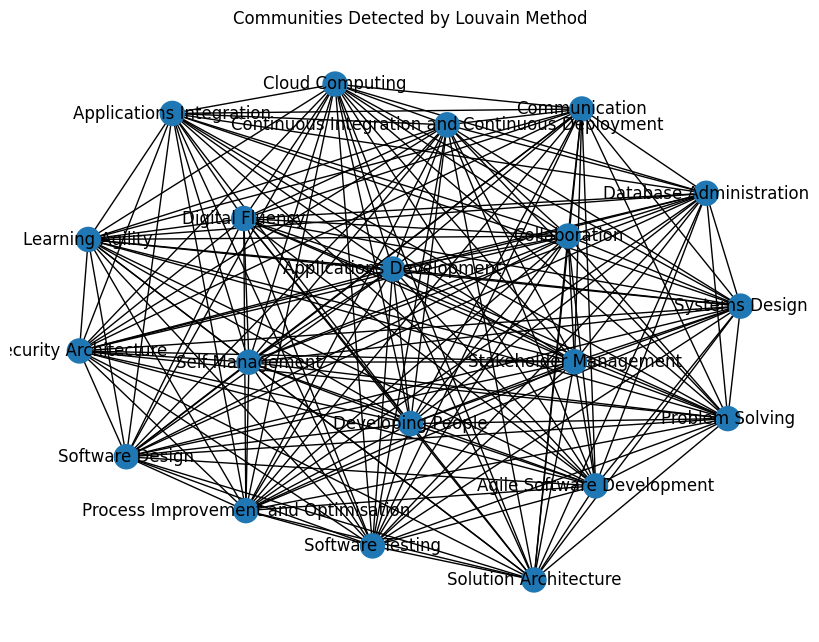

In [ ]:
import community.community_louvain as community_louvain

louvain_partition = community_louvain.best_partition(G_dup) #This returns the partition map

# Visualize
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G_dup)
colors = [louvain_partition[node] for node in G_dup.nodes()]
nx.draw(G_dup, pos, node_color=colors, with_labels=True, cmap='tab10')
plt.title("Communities Detected by Louvain Method")
plt.show()

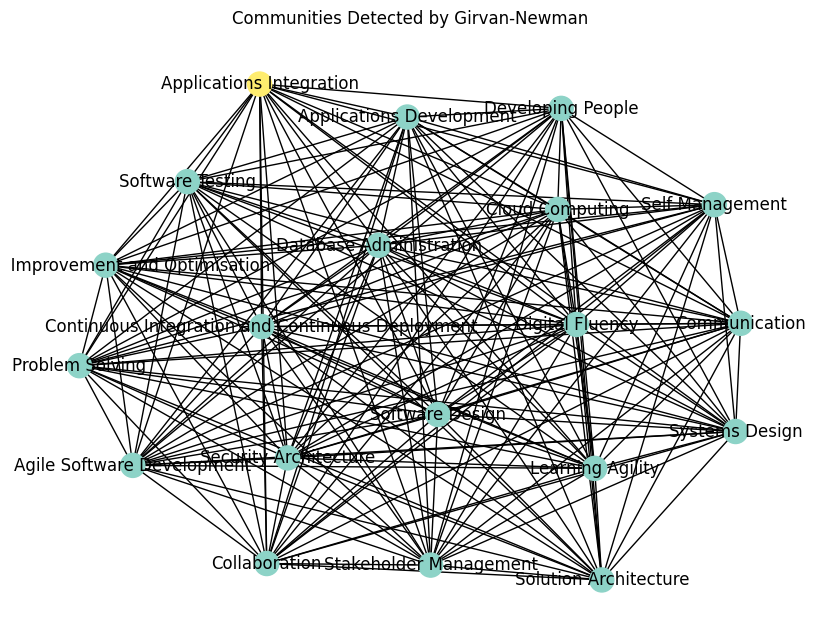

In [ ]:
from networkx.algorithms.community import girvan_newman

# Apply Girvan-Newman
comp = girvan_newman(G_dup)
first_split = tuple(sorted(c) for c in next(comp))

# Get partition map
girvan_newman_map = {}
for idx, community in enumerate(first_split):
    for node in community:
        girvan_newman_map[node] = idx

plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G_dup)
colors = [girvan_newman_map[node] for node in G_dup.nodes()]
nx.draw(G_dup, pos, node_color=colors, with_labels=True, cmap='Set3')
plt.title("Communities Detected by Girvan-Newman")
plt.show()

In [ ]:
df_gemini = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Sprint 4/job_descriptions_gemini.csv')

In [ ]:
df_gemini.head()

,description_clean,top_10_skills_gpt5
0,"Your Duties and Responsibilities Indepth understanding of MVC, ObjectOriented Programming and experience with PHP Frameworks Codeigniter, Laravel and etc., Developing userfacing applications using Vue.js nuxt js Develop, bug fixing, improving application performance and maintain web projects Outline and communicate in detail any bugs or errors encountered in development. Basic knowledge of Linux commands and Amazon Web Services Proficient understanding of code versioning tool Git and Github Job Type Fulltime Pay Php20,000.00 Php30,000.00 per month Benefits Additional leave Company Christmas gift Company events Flexible schedule Health insurance Opportunities for promotion Paid training Pay raise Staff meals provided Schedule 8 hour shift Monday to Friday Supplemental Pay 13th month salary Overtime pay Application Questions Knowledgeable in PHPLARAVEL Expected Start Date 05202025","['Git', 'Nuxt.js', 'PHP', 'OOP', 'CodeIgniter', 'Laravel', 'MVC', 'Vue.js', 'AWS', 'Github']"
1,"We are looking for a Backend Developer who will participate in the entire application lifecycle and focus on coding and debugging, write clean codes to develop functional web applications, troubleshoot and debug applications, and perform UI tests to optimize performance. Responsibilities Develop and maintain robust backend services using Python, Flask, prioritizing performance, scalability, and security. Design, document, and implement RESTful APIs for seamless communication with frontend applications and thirdparty integrations. Champion the design and implementation of a microservices architecture for modularity, flexibility, and future platform growth. Lead the team in utilizing Docker and Kubernetes for efficient backend application deployment, scaling, and management. Collaborate with crossfunctional teams to translate product vision into technical solutions and drive backend roadmap execution. Mentor junior engineers on best practices and help them elevate their skills. Stay uptodate with the latest backend technologies and trends in REST APIs, microservices, and containerization. Qualifications Proven backend expertise 3 years designing, developing, and maintaining robust and scalable backend systems. Extensive experience with Python, including advanced concepts e.g., asynchronous programming, concurrency, and a deep understanding of the Flask framework, including RESTful API design and development. Solid experience with relational databases MySQL, PostgreSQL, including schema design, query optimization, and performance tuning. Practical experience with CICD pipelines e.g., GitHub Actions. A strong understanding of DevOps principles. Working knowledge of cloud platforms AWS, Google Cloud, including deploying and managing applications in cloud environments. Experience with Docker for containerization. Strong understanding of security best practices for backend systems, including authentication, authorization, and data encryption.","['CI/CD', 'RESTful APIs', 'MySQL', 'Flask', 'Communication', 'APIs', 'Teamwork', 'Postgres', 'Mentoring', 'Microservices']"
2,"Job Overview We are seeking skilled React.js Developer to join our dynamic team. The ideal candidate will have a strong foundation in JavaScript, SharePoint APIs, excellent problemsolving abilities, and a passion for building userfriendly web applications. Key Responsibilities Develop and maintain userfriendly web applications using React.js. Collaborate with designers and backend developers to create seamless, responsive user interfaces. Write clean, maintainable code and ensure the performance of applications. Participate in code reviews and contribute to team knowledge sharing. Debug and optimize applications for maximum speed and scalability. Stay updated with the latest industry trends and best practices in web development. Qualifications Bachelors degree in computer science, Engineering, or related field. Minimum 4 years experience as a React.js Devel

In [ ]:
import pandas as pd
import itertools
import ast

# 1️⃣ Convert the string representation into real lists
df_gemini['top_10_skills_gpt5'] = df_gemini['top_10_skills_gpt5'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# 2️⃣ Create a list to store all edges
edges = []

# 3️⃣ Loop through each row and generate all unique skill pairs
for skill_list in df_gemini['top_10_skills_gpt5']:
    if isinstance(skill_list, list) and len(skill_list) > 1:
        # Generate all 2-combinations of skills within the same job post
        pairs = list(itertools.combinations(sorted(set(skill_list)), 2))
        edges.extend(pairs)

# 4️⃣ Convert the list of tuples into a DataFrame
df_edges_gemini= pd.DataFrame(edges, columns=['source', 'target'])


df_edges_gemini.head()


,source,target
0,AWS,CodeIgniter
1,AWS,Git
2,AWS,Github
3,AWS,Laravel
4,AWS,MVC


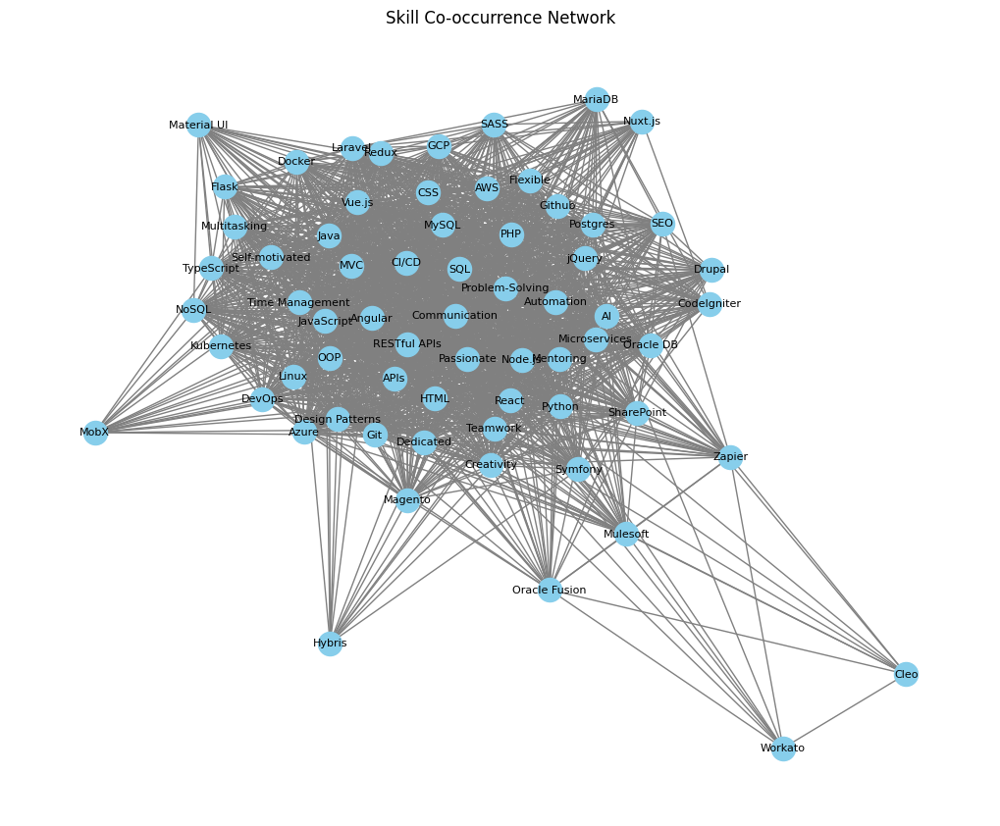

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# 1️⃣ Build the graph from your edges DataFrame
G_gem = nx.from_pandas_edgelist(df_edges_gemini, source='source', target='target')

# 2️⃣ Plot the network
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G_gem, k=0.3, seed=42)  # Layout for better spacing
nx.draw(
    G_gem,
    pos,
    with_labels=True,
    node_size=300,
    node_color='skyblue',
    edge_color='gray',
    font_size=8
)
plt.title("Skill Co-occurrence Network")
plt.show()


In [ ]:
import networkx as nx

# Compute all centralities
degree_centrality = nx.degree_centrality(G_gem)
betweenness = nx.betweenness_centrality(G_gem)
closeness = nx.closeness_centrality(G_gem)
eigenvector = nx.eigenvector_centrality(G_gem)

# Create a summary DataFrame
centrality_df = pd.DataFrame({
    'Skill': list(degree_centrality.keys()),
    'Degree Centrality': list(degree_centrality.values()),
    'Betweenness Centrality': list(betweenness.values()),
    'Closeness Centrality': list(closeness.values()),
    'Eigenvector Centrality': list(eigenvector.values())
})

# Sort by degree centrality (or any metric you prefer)
centrality_df = centrality_df.sort_values(by='Degree Centrality', ascending=False).reset_index(drop=True)

# Display top 10
print("📊 Centrality Measures of G (with duplicates):\n")
for i, row in centrality_df.head(10).iterrows():
    print(f"{i+1}. {row['Skill']}")
    print(f"   - Degree Centrality: {row['Degree Centrality']:.4f}")
    print(f"   - Betweenness Centrality: {row['Betweenness Centrality']:.4f}")
    print(f"   - Closeness Centrality: {row['Closeness Centrality']:.4f}")
    print(f"   - Eigenvector Centrality: {row['Eigenvector Centrality']:.4f}")
    print()


📊 Centrality Measures of G (with duplicates):

1. Teamwork
   - Degree Centrality: 1.0000
   - Betweenness Centrality: 0.0176
   - Closeness Centrality: 1.0000
   - Eigenvector Centrality: 0.1446

2. React
   - Degree Centrality: 1.0000
   - Betweenness Centrality: 0.0176
   - Closeness Centrality: 1.0000
   - Eigenvector Centrality: 0.1446

3. Node.js
   - Degree Centrality: 0.9846
   - Betweenness Centrality: 0.0153
   - Closeness Centrality: 0.9848
   - Eigenvector Centrality: 0.1440

4. Communication
   - Degree Centrality: 0.9692
   - Betweenness Centrality: 0.0080
   - Closeness Centrality: 0.9701
   - Eigenvector Centrality: 0.1440

5. Passionate
   - Degree Centrality: 0.9538
   - Betweenness Centrality: 0.0072
   - Closeness Centrality: 0.9559
   - Eigenvector Centrality: 0.1428

6. APIs
   - Degree Centrality: 0.9538
   - Betweenness Centrality: 0.0061
   - Closeness Centrality: 0.9559
   - Eigenvector Centrality: 0.1433

7. Creativity
   - Degree Centrality: 0.9385
   - Betw

In [ ]:
# Count frequency of each skill pair (with duplicates)
cooccur_df = df_edges_gemini.value_counts().reset_index(name='weight')
cooccur_df.columns = ['source', 'target', 'weight']

# Sort descending by frequency
cooccur_df = cooccur_df.sort_values(by='weight', ascending=False).reset_index(drop=True)

cooccur_df.head(10)


,source,target,weight
0,Communication,Teamwork,4799
1,Passionate,Teamwork,1972
2,SQL,Teamwork,1875
3,JavaScript,Teamwork,1690
4,Python,Teamwork,1668
5,Automation,Teamwork,1500
6,AWS,Teamwork,1475
7,Communication,SQL,1425
8,Communication,Passionate,1330
9,Communication,Python,1310


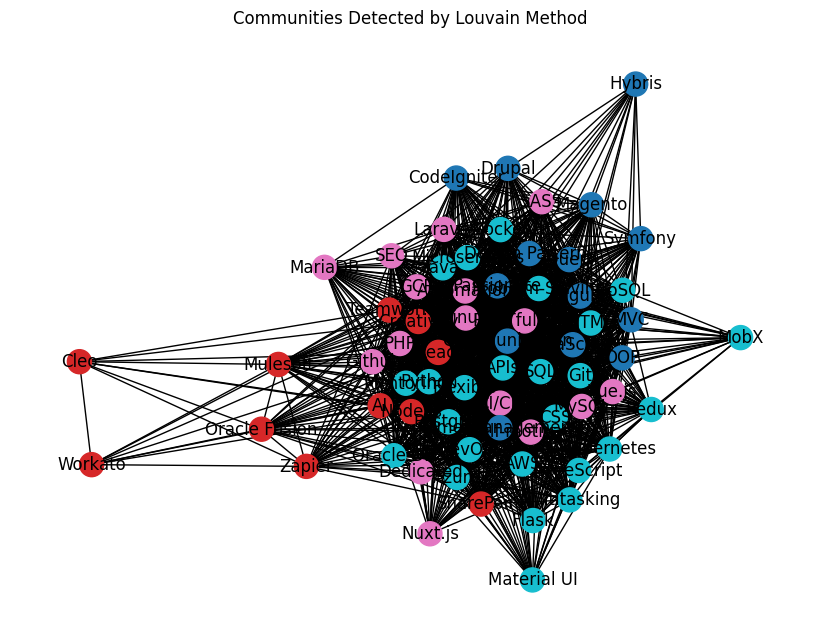

In [ ]:
import community.community_louvain as community_louvain

louvain_partition = community_louvain.best_partition(G_gem) #This returns the partition map

# Visualize
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G_gem)
colors = [louvain_partition[node] for node in G_gem.nodes()]
nx.draw(G_gem, pos, node_color=colors, with_labels=True, cmap='tab10')
plt.title("Communities Detected by Louvain Method")
plt.show()

In [ ]:
from collections import defaultdict

# Group nodes by community
communities = defaultdict(list)
for node, comm_id in louvain_partition.items():
    communities[comm_id].append(node)

# Print each community
for comm_id, nodes in communities.items():
    print(f"Community {comm_id}: {nodes}")


Community 3: ['AWS', 'Git', 'APIs', 'Flask', 'Mentoring', 'Microservices', 'Postgres', 'Redux', 'Flexible', 'SQL', 'Azure', 'Kubernetes', 'Python', 'DevOps', 'CSS', 'HTML', 'TypeScript', 'Docker', 'Java', 'Oracle DB', 'NoSQL', 'Problem-Solving', 'Multitasking', 'Material UI', 'MobX']
Community 0: ['CodeIgniter', 'MVC', 'OOP', 'Communication', 'JavaScript', 'Passionate', 'Angular', 'Time Management', 'Design Patterns', 'Symfony', 'jQuery', 'Drupal', 'Magento', 'Hybris']
Community 2: ['Github', 'Laravel', 'Nuxt.js', 'PHP', 'Vue.js', 'CI/CD', 'MySQL', 'RESTful APIs', 'Automation', 'GCP', 'MariaDB', 'SEO', 'Linux', 'Self-motivated', 'Dedicated', 'SASS']
Community 1: ['Teamwork', 'React', 'SharePoint', 'Node.js', 'AI', 'Cleo', 'Creativity', 'Mulesoft', 'Oracle Fusion', 'Workato', 'Zapier']


In [ ]:
df_combine = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Sprint 4/DSF-Sprint4-data_G3.csv', index_col = 0)

In [ ]:
df_combine.head()

,id,title,company,location,date_posted,min_amount,max_amount,is_remote,description,job,description_clean,Gemini_JAS,Gemini_RR,AAP_Skills
0,in-a1452764f84ab159,Backend Developer,Glophics Web Design and Advertising Inc.,"Cebu City, P07, PH",2025-04-16,264757,335242,False,"Your Duties and Responsibilities:\n\n* In\-depth understanding of MVC, Object\-Oriented Programming and experience with PHP Frameworks (Codeigniter, Laravel and etc.,)\n* Developing user\-facing applications using Vue.js // nuxt js\n* Develop, bug fixing, improving application performance and maintain web projects\n* Outline and communicate in detail any bugs or errors encountered in development.\n* Basic knowledge of Linux commands and Amazon Web Services\n* Proficient understanding of code versioning tool Git and Github\n\nJob Type: Full\-time\n\nPay: Php20,000\.00 \- Php30,000\.00 per month\n\nBenefits:\n\n* Additional leave\n* Company Christmas gift\n* Company events\n* Flexible schedule\n* Health insurance\n* Opportunities for promotion\n* Paid training\n* Pay raise\n* Staff meals provided\n\nSchedule:\n\n* 8 hour shift\n* Monday to Friday\n\nSupplemental Pay:\n\n* 13th month salary\n* Overtime pay\n\nApplication Question(s):\n\n* Knowledgeable in PHP\-LARAVEL?\n\nExpected Start Date: 05//20//2025",backend developer,"Your Duties and Responsibilities Indepth understanding of MVC, ObjectOriented Programming and experience with PHP Frameworks Codeigniter, Laravel and etc., Developing userfacing applications using Vue.js nuxt js Develop, bug fixing, improving application performance and maintain web projects Outline and communicate in detail any bugs or errors encountered in development. Basic knowledge of Linux commands and Amazon Web Services Proficient understanding of code versioning tool Git and Github Job Type Fulltime Pay Php20,000.00 Php30,000.00 per month Benefits Additional leave Company Christmas gift Company events Flexible schedule Health insurance Opportunities for promotion Paid training Pay raise Staff meals provided Schedule 8 hour shift Monday to Friday Supplemental Pay 13th month salary Overtime pay Application Questions Knowledgeable in PHPLARAVEL Expected Start Date 05202025",NaN,"['Git', 'Nuxt.js', 'PHP', 'OOP', 'CodeIgniter', 'Laravel', 'MVC', 'Vue.js', 'AWS', 'Github']","['Digital Fluency', 'Applications Development', 'Cloud Computing', 'Continuous Integration and Continuous Deployment', 'Software Testing', 'Problem Solving', 'Learning Agility', 'Developing People', 'Communication', 'Self Management']"
1,in-d2ff9d59e4886004,Backend Developer,Atticus Solutions,"P00, PH",2025-04-15,NaN,NaN,False,"We are looking for a Backend Developer who will participate in the entire application lifecycle and focus on coding and debugging, write clean codes to develop functional web applications, troubleshoot and debug applications, and perform UI tests to optimize performance.\n\n \n\n**Responsibilities:** \n\n* Develop and maintain robust backend services using Python, Flask,\n\n\nprioritizing performance, scalability, and security. \n\n* Design, document, and implement RESTful APIs for seamless communication\n\n\nwith front\-end applications and third\-party integrations. \n\n* Champion the design and implementation of a microservices architecture\n\n\nfor modularity, flexibility, and future platform growth. \n\n* Lead the team in utilizing Docker and Kubernetes for efficient backend application deployment, scaling, and management.\n\n* Collaborate with cross\-functional teams to translate product vision into\n\n\ntechnical solutions and drive backend roadmap execution. \n\n* Mentor junior engineers on best practices and help them elevate their skills.\n* Stay up\-to\-date with the latest backend technologies and trends in REST\n\n\nAPIs, microservices, and containerization. \n\n**Qualifications:** \n\n* Proven backend expertise (3\+ years) designing, developing, and maintaining robust and scalable backend systems.\n* Extensive experience with Python

In [ ]:
df_combine.shape

(11456, 14)

In [ ]:
df.shape

(11456, 11)

In [ ]:
df_combine.columns

Index(['id', 'title', 'company', 'location', 'date_posted', 'min_amount',
       'max_amount', 'is_remote', 'description', 'job', 'description_clean',
       'Gemini_JAS', 'Gemini_RR', 'AAP_Skills'],
      dtype='object')

In [ ]:
hris = df_combine[df_combine["title"].str.contains("hris", case=False, na=False)]
print(hris.shape)
hris.head()

(6, 14)


id  \
6479   in-622faa307147b453   
6509   in-144ceb9f317548f4   
9504   in-8b60ae85eb96bc2e   
10178  in-a2f934bd9dbaa374   
10586  in-622faa307147b453   

                                                      title       company  \
6479   Sr. Full Stack Developer | HRIS experience is a MUST  IFIVE Global   
6509   Sr. Full Stack Developer | HRIS experience is a MUST  IFIVE Global   
9504                              HRIS System Administrator     TSA Group   
10178                                          HRIS Analyst   RingCentral   
10586  Sr. Full Stack Developer | HRIS experience is a MUST  IFIVE Global   

              location date_posted  min_amount  max_amount  is_remote  \
6479    Pasig, P00, PH  2025-04-02     1694449     2145550      False   
6509    Pasig, P00, PH  2025-03-26     1694449     2145550      False   
9504    Pasay, P00, PH  2024-11-12         NaN         NaN      False   
10178  Manila, P00, PH  2024-05-22         NaN         NaN       True   
10586   Pasig, P00, PH  2025-04-02     1694449     2145550      False   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [ ]:
data_scientist = df_combine[df_combine["title"].str.contains("data scientist", case=False, na=False)]
print(data_scientist.shape)
data_scientist.head()

(134, 14)


id  \
1271  in-d0cb614e144f16f3   
2109  in-d759e26c8336e3fc   
2980  in-5f121d4fbd83186d   
3022  in-5231576ea49578c2   
3148  in-aa0a70ea396ae874   

                                                                                   title  \
1271                                                                      Data Scientist   
2109                               Data Scientist (with Master's Degree)- Fresh Graduate   
2980  Lead Data Scientist / Machine Learning Engineer – Consultancy/Academic Partnership   
3022                                                                      Data Scientist   
3148                                                                      Data Scientist   

               company             location date_posted  min_amount  \
1271  Trend Micro Inc.      Manila, P00, PH  2023-08-24         NaN   
2109   Western Digital  Biñan City, 04A, PH  2025-03-25         NaN   
2980         CreditBPO      Taguig, P00, PH  2025-02-23         NaN   
3022     Talentium Inc      Makati, P00, PH  2025-01-26         NaN   
3148               ING      Taguig, P00, PH  2025-03-28         NaN   

      max_amount  is_remote  \
1271         NaN      False   
2109         NaN      False   
2980         NaN       True   
3022         NaN      False   
3148         NaN      False   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

In [ ]:
data_analyst = df_combine[df_combine["title"].str.contains("data analyst", case=False, na=False)]
print(data_analyst.shape)
data_analyst.head()

(655, 14)


id                                         title  \
783   in-e3b9a39941264868  Data Analyst - Intermediate (Work from Home)   
921   in-64a2945992a56a29                    Cybersecurity Data Analyst   
1192  in-31b6ce9c30c293dd                                  Data Analyst   
1360  in-498d10534035b523                                  Data Analyst   
1680  in-5ae759ba53ebd4b1                                  Data Analyst   

                    company              location date_posted  min_amount  \
783   Quantrics Enterprises                    PH  2025-03-21         NaN   
921                 Emerson  Mandaluyong, P00, PH  2025-03-05         NaN   
1192        Macquarie Group       Manila, P00, PH  2024-11-13         NaN   
1360   Sarisuki Stores Inc.     San Juan, P00, PH  2025-04-08         NaN   
1680               SariSuki     San Juan, P00, PH  2025-01-07         NaN   

      max_amount  is_remote  \
783          NaN       True   
921          NaN      False   
1192         NaN      False   
1360         NaN      False   
1680         NaN      False   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

In [ ]:
ai_engineer = df_combine[df_combine["title"].str.contains("data analyst", case=False, na=False)]
print(ai_engineer.shape)
ai_engineer.head()

(655, 14)


id                                         title  \
783   in-e3b9a39941264868  Data Analyst - Intermediate (Work from Home)   
921   in-64a2945992a56a29                    Cybersecurity Data Analyst   
1192  in-31b6ce9c30c293dd                                  Data Analyst   
1360  in-498d10534035b523                                  Data Analyst   
1680  in-5ae759ba53ebd4b1                                  Data Analyst   

                    company              location date_posted  min_amount  \
783   Quantrics Enterprises                    PH  2025-03-21         NaN   
921                 Emerson  Mandaluyong, P00, PH  2025-03-05         NaN   
1192        Macquarie Group       Manila, P00, PH  2024-11-13         NaN   
1360   Sarisuki Stores Inc.     San Juan, P00, PH  2025-04-08         NaN   
1680               SariSuki     San Juan, P00, PH  2025-01-07         NaN   

      max_amount  is_remote  \
783          NaN       True   
921          NaN      False   
1192         NaN      False   
1360         NaN      False   
1680         NaN      False   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

In [ ]:
data_architect = df_combine[df_combine["title"].str.contains("data architect", case=False, na=False)]
print(data_architect.shape)
data_architect.head()

(28, 14)


id                        title  \
243   in-f3698f9beedc7a3d               Data Architect   
1719  in-b34fb5bdcc449c26               Data Architect   
1720  in-307311220eaa3c06               Data Architect   
3061  in-2968ac9e592c048c  Data Architect (Mid-Senior)   
3091  in-b34fb5bdcc449c26               Data Architect   

                     company            location date_posted  min_amount  \
243                 Netskope                  PH  2025-03-15         NaN   
1719  Questronix Corporation    Ortigas, P00, PH  2024-01-15         NaN   
1720  Questronix Corporation    Ortigas, P00, PH  2024-01-09         NaN   
3061             Umpisa Inc.  Work from Home, PH  2024-11-11         NaN   
3091  Questronix Corporation    Ortigas, P00, PH  2024-01-15         NaN   

      max_amount  is_remote  \
243          NaN      False   
1719         NaN      False   
1720         NaN      False   
3061         NaN       True   
3091         NaN      False   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

In [ ]:
special_ops = df_combine[df_combine["title"].str.contains("operations analyst", case=False, na=False)]
print(special_ops.shape)
special_ops.head()

(25, 14)


id                                        title  \
458  in-0b9a918b7e3ed88f           Junior Security Operations Analyst   
915  in-36c6858a260a5d1c            Junior Network Operations Analyst   
938  in-1e9b851f3a19e81f                        IT Operations Analyst   
987  in-5f68abfd7ee32457        Senior IT Security Operations Analyst   
996  in-ba9683b5a17382f8  Security Operations Analyst (SOC) – Level 2   

                company         location date_posted  min_amount  max_amount  \
458  Trends Group, Inc.  Makati, P00, PH  2025-04-07         NaN         NaN   
915  Trends Group, Inc.  Makati, P00, PH  2025-03-06         NaN         NaN   
938  Trends Group, Inc.  Makati, P00, PH  2025-03-03         NaN         NaN   
987       Aurecon Group  Manila, P00, PH  2025-02-19         NaN         NaN   
996  Nexus Technologies  Makati, P00, PH  2025-02-18         NaN         NaN   

     is_remote  \
458      False   
915      False   
938      False   
987      False   
996      False   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 

In [ ]:
def roles_cat(df_combine):
    # Make a copy to avoid modifying the original DataFrame
    df_bipartite = df_combine.copy()
    df_bipartite['role_cat'] = 'Other'  # default category

    # Define role categories by keyword matches in job titles
    df_bipartite.loc[df_bipartite['title'].str.contains('hris', case=False, na=False), 'role_cat'] = 'HRIS'
    df_bipartite.loc[df_bipartite['title'].str.contains('ux', case=False, na=False), 'role_cat'] = 'UX'
    df_bipartite.loc[df_bipartite['title'].str.contains('network engineer', case=False, na=False), 'role_cat'] = 'Network Engineer'
    df_bipartite.loc[df_bipartite['title'].str.contains('data engineer', case=False, na=False), 'role_cat'] = 'Data Engineer'
    df_bipartite.loc[df_bipartite['title'].str.contains('data scientist', case=False, na=False), 'role_cat'] = 'Data Scientist'
    df_bipartite.loc[df_bipartite['title'].str.contains('data analyst', case=False, na=False), 'role_cat'] = 'Data Analyst'
    df_bipartite.loc[df_bipartite['title'].str.contains('ai', case=False, na=False), 'role_cat'] = 'AI'
    df_bipartite.loc[df_bipartite['title'].str.contains('data architect', case=False, na=False), 'role_cat'] = 'Data Architect'
    df_bipartite.loc[df_bipartite['title'].str.contains('ml engineer', case=False, na=False), 'role_cat'] = 'ML Engineer'
    df_bipartite.loc[df_bipartite['title'].str.contains('engineer', case=False, na=False), 'role_cat'] = 'Engineer'

    return df_bipartite


In [ ]:
df_ember = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Sprint 4/df_job.csv')

In [ ]:
df_ember['Consolidated_Skills'] = df_ember['Consolidated_Skills'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

In [ ]:
df_ember['Role_Category'] = df_ember['Role_Category'].replace('AI', 'AI Dev')

In [ ]:
df_ember['Role_Category'].value_counts()

,count
Role_Category,
Other,7631
Engineer,1893
Data Analyst,655
Data Engineer,492
UX,351
AI Dev,229
Data Scientist,134
Data Architect,28
Operations Analyst,25


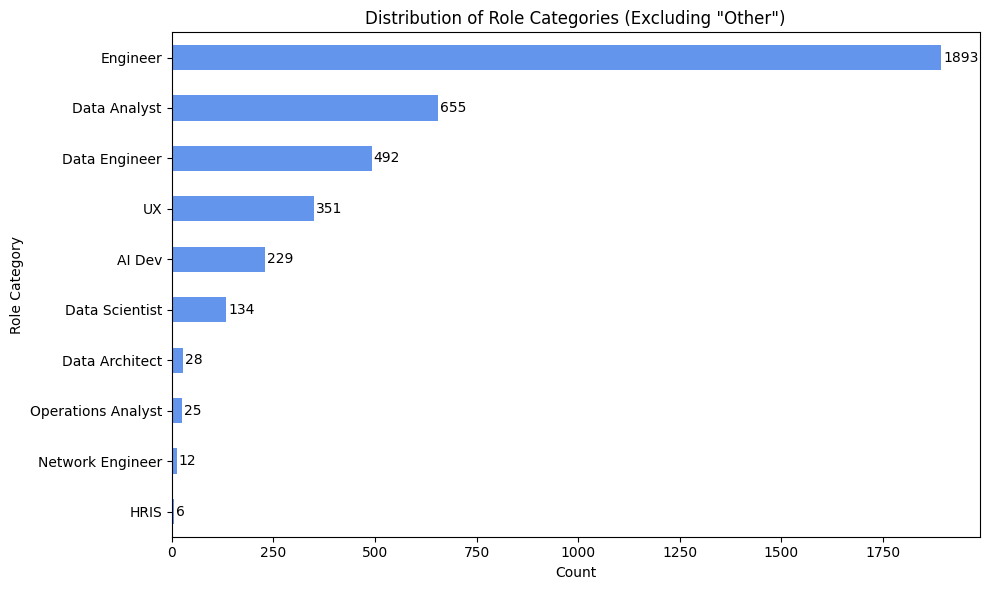

In [ ]:
import matplotlib.pyplot as plt

# Get counts excluding "Other"
role_counts = df_ember['Role_Category'].value_counts().drop('Other', errors='ignore').sort_values(ascending=True)

# Plot bar chart
plt.figure(figsize=(10, 6))
bars = role_counts.plot(kind='barh', color='cornflowerblue')

# Add labels and title
plt.xlabel('Count')
plt.ylabel('Role Category')
plt.title('Distribution of Role Categories (Excluding "Other")')

# Add count labels to each bar
for i, v in enumerate(role_counts):
    plt.text(v + 5, i, str(v), va='center', fontsize=10)  # v+5 shifts the label slightly right

plt.tight_layout()
plt.show()


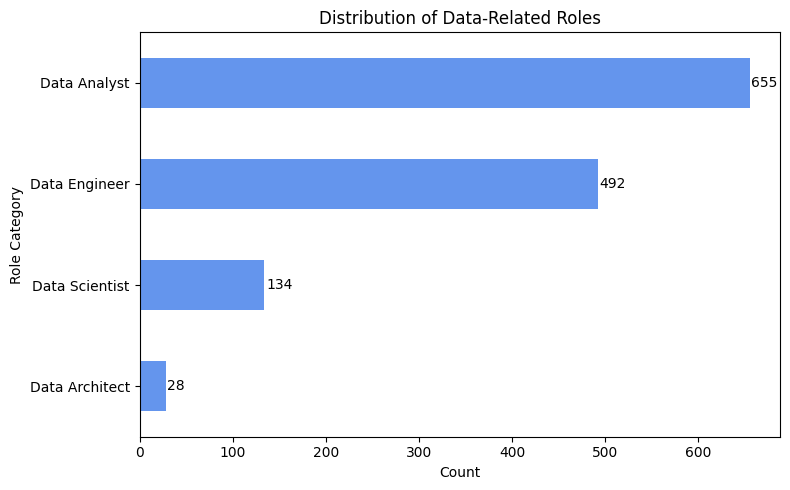

In [ ]:
import matplotlib.pyplot as plt

# Define only the data-related roles (now including AI)
data_roles = ['Data Analyst', 'Data Engineer', 'Data Scientist', 'Data Architect', 'AI']

# Filter and count only these roles
role_counts = df_ember[df_ember['Role_Category'].isin(data_roles)]['Role_Category'].value_counts().sort_values(ascending=True)

# Plot
plt.figure(figsize=(8, 5))
bars = role_counts.plot(kind='barh', color='cornflowerblue')

# Add labels and title
plt.xlabel('Count')
plt.ylabel('Role Category')
plt.title('Distribution of Data-Related Roles')

# Add count labels
for i, v in enumerate(role_counts):
    plt.text(v + 2, i, str(v), va='center', fontsize=10)

plt.tight_layout()
plt.show()


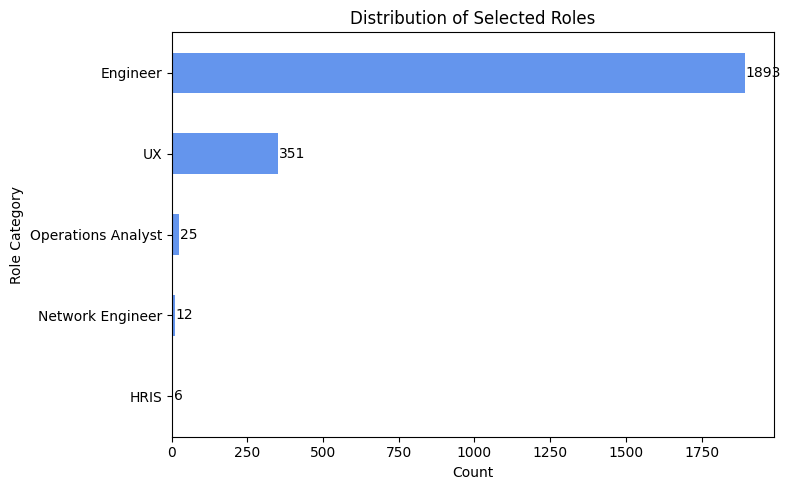

In [ ]:
import matplotlib.pyplot as plt

# Define only the selected roles
selected_roles = ['UX', 'Operations Analyst', 'Engineer', 'Network Engineer', 'HRIS']

# Filter and count only these roles
role_counts = df_ember[df_ember['Role_Category'].isin(selected_roles)]['Role_Category'].value_counts().sort_values(ascending=True)

# Plot
plt.figure(figsize=(8, 5))
bars = role_counts.plot(kind='barh', color='cornflowerblue')

# Add labels and title
plt.xlabel('Count')
plt.ylabel('Role Category')
plt.title('Distribution of Selected Roles')

# Add count labels
for i, v in enumerate(role_counts):
    plt.text(v + 2, i, str(v), va='center', fontsize=10)

plt.tight_layout()
plt.show()


In [ ]:
# import re
# import pandas as pd

# def roles_cat_extract_and_append(df_combine):
#     """
#     For each role pattern, extract rows from df_combine whose title matches the pattern,
#     add a 'role_cat' column with the role name, and append to df_bipartite.
#     Rows that match multiple roles will appear multiple times (one per role).
#     """
#     # Define roles and regex patterns (order matters: more specific first)
#     role_patterns = [
#         ("Data Scientist", r"\bdata scientist\b"),
#         ("ML Engineer", r"\bml engineer\b|\bmachine learning engineer\b"),
#         ("Data Engineer", r"\bdata engineer\b"),
#         ("Data Analyst", r"\bdata analyst\b"),
#         ("Data Architect", r"\bdata architect\b"),
#         ("AI", r"\bai\b|\bartificial intelligence\b"),
#         ("Network Engineer", r"\bnetwork engineer\b"),
#         ("UX", r"\bux\b|\buser experience\b"),
#         ("HRIS", r"\bhris\b"),
#         ("Engineer", r"\bengineer\b"),  # keep general 'Engineer' later to avoid premature matches
#     ]

#     extracted_parts = []  # list to collect role-specific subsets

#     # Ensure 'title' exists
#     if 'title' not in df_combine.columns:
#         raise ValueError("df_combine must contain a 'title' column")

#     # Loop roles, extract matching rows and append
#     for role_name, pattern in role_patterns:
#         mask = df_combine['title'].fillna('').str.contains(pattern, case=False, na=False, regex=True)
#         subset = df_combine[mask].copy()
#         if not subset.empty:
#             subset['role_cat'] = role_name
#             extracted_parts.append(subset)

#     # Concatenate all extracted parts. If nothing matched, return empty df with role_cat col
#     if extracted_parts:
#         df_bipartite = pd.concat(extracted_parts, ignore_index=True)
#     else:
#         # return empty df with same columns + role_cat
#         df_bipartite = df_combine.head(0).copy()
#         df_bipartite['role_cat'] = pd.Series(dtype=str)

#     return df_bipartite


In [ ]:
# df_bipartite = roles_cat_extract_and_append(df_combine)


In [ ]:
# df_bipartite.shape

In [ ]:
# import re
# import pandas as pd

# def roles_cat_extract_and_append(df_combine):
#     """
#     Extracts rows for each matching role keyword and appends them to df_bipartite.
#     Rows that match multiple roles will appear multiple times (one per role).
#     Unmatched rows are labeled as 'Other'.
#     """
#     role_patterns = [
#         ("Data Scientist", r"\bdata scientist\b"),
#         ("ML Engineer", r"\bml engineer\b|\bmachine learning engineer\b"),
#         ("Data Engineer", r"\bdata engineer\b"),
#         ("Data Analyst", r"\bdata analyst\b"),
#         ("Data Architect", r"\bdata architect\b"),
#         ("AI", r"\bai\b|\bartificial intelligence\b"),
#         ("Network Engineer", r"\bnetwork engineer\b"),
#         ("UX", r"\bux\b|\buser experience\b"),
#         ("HRIS", r"\bhris\b"),
#         ("Engineer", r"\bengineer\b"),  # keep general last
#     ]

#     extracted_parts = []

#     if 'title' not in df_combine.columns:
#         raise ValueError("df_combine must contain a 'title' column")

#     # Track all indices that matched at least one role
#     matched_indices = set()

#     for role_name, pattern in role_patterns:
#         mask = df_combine['title'].fillna('').str.contains(pattern, case=False, na=False, regex=True)
#         subset = df_combine[mask].copy()
#         if not subset.empty:
#             subset['role_cat'] = role_name
#             extracted_parts.append(subset)
#             matched_indices.update(subset.index)

#     # Identify rows that did not match any pattern
#     unmatched_mask = ~df_combine.index.isin(matched_indices)
#     unmatched = df_combine[unmatched_mask].copy()
#     unmatched['role_cat'] = 'Other'

#     # Append 'Other' rows too
#     extracted_parts.append(unmatched)

#     # Combine all results
#     df_bipartite = pd.concat(extracted_parts, ignore_index=True)

#     return df_bipartite


In [ ]:
df_ember.columns

Index(['title', 'description_clean', 'location', 'date_posted', 'min_amount',
       'max_amount', 'Gemini_RR', 'AAP_Skills', 'Consolidated_Skills',
       'Role_Category'],
      dtype='object')

In [ ]:
df_ember_roles = df_ember[~df_ember['Role_Category'].str.contains('Other', case=False, na=False)]
df_ember_roles.shape

(3825, 10)

In [ ]:
df_ember_roles[['Consolidated_Skills','Role_Category']]

,Consolidated_Skills,Role_Category
29,"[Database Administration, APIs, Microservices, Problem Solving, Teamwork, Node.js, Cloud Computing, Software Testing, Software Design, RESTful APIs, Systems Design, Automation, Digital Fluency, AWS, AI, Learning Agility, SQL, PHP, Applications Development, Collaboration]",AI Dev
58,"[Database Administration, APIs, Continuous Integration and Continuous Deployment, Communication, Git, Problem Solving, Developing People, JavaScript, Software Testing, Software Design, Java, RESTful APIs, Digital Fluency, Learning Agility, Applications Development]",Engineer
59,"[Database Administration, APIs, Microservices, Problem Solving, Teamwork, Node.js, Cloud Computing, Software Testing, Software Design, RESTful APIs, Systems Design, Automation, Digital Fluency, AWS, AI, Learning Agility, SQL, PHP, Applications Development, Collaboration]",AI Dev
65,"[Database Administration, Passionate, APIs, Microservices, OOP, Communication, Problem Solving, Teamwork, Software Testing, Software Design, RESTful APIs, Security Architecture, Systems Design, Python, Automation, Digital Fluency, SQL, Applications Development, Collaboration, Stakeholder Management]",Engineer
69,"[Flexible, Systems Design, APIs, Communication, Digital Fluency, Applications Integration, Collaboration, PHP, Teamwork, Applications Development, Software Testing, Software Design]",Engineer
...,...,...
11420,"[Docker, Agile Software Development, DevOps, Microservices, Continuous Integration and Continuous Deployment, Communication, Git, Developing People, Software Testing, Software Design, Security Architecture, Systems Design, Digital Fluency, Applications Development, TypeScript]",UX
11427,"[Passionate, Angular, Flexible, Security Architecture, APIs, Systems Design, Continuous Integration and Continuous Deployment, Digital Fluency, Git, Learning Agility, Problem Solving, Collaboration, Teamwork, JavaScript, Applications Development, Creativity, Software Testing, Software Design]",Engineer
11442,"[Azure, Database Administration, Passionate, DevOps, Continuous Integration and Continuous Deployment, Git, Problem Solving, Teamwork, Cloud Computing, Dedicated, Software Testing, Software Design, MySQL, Security Architecture, Digital Fluency, SQL, Applications Development, Collaboration, Oracle DB, Design Patterns]",Engineer
11443,"[Database Administration, Agile Software Development, Postgres, APIs, Continuous Integration and Continuous Deployment, OOP, Teamwork, JavaScript, Node.js, Cloud Computing, Software Testing, MySQL, RESTful APIs, Systems Design, Automation, Digital Fluency, Process Improvement and Optimisation, Applications Development, React]",Engineer


In [ ]:
import ast
import pandas as pd

# Step 1 — Ensure Consolidated_Skills are real lists
df_ember_roles['Consolidated_Skills'] = df_ember_roles['Consolidated_Skills'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# Step 2 — Explode the list of skills so each skill gets its own row
df_skills_exploded = df_ember_roles.explode('Consolidated_Skills')

# Step 3 — Clean up the column name for convenience
df_skills_exploded.rename(columns={'Consolidated_Skills': 'Skill'}, inplace=True)

# Step 4 — Count skill frequencies per role category
skill_counts = (
    df_skills_exploded.groupby(['Role_Category', 'Skill'])
    .size()
    .reset_index(name='Count')
)

# Step 5 — Get top 10 skills per role
top10_skills_per_role = (
    skill_counts.sort_values(['Role_Category', 'Count'], ascending=[True, False])
    .groupby('Role_Category')
    .head(10)
)

# Step 6 — Preview result
print(top10_skills_per_role)


    Role_Category                                             Skill  Count
5          AI Dev                          Applications Development    221
0          AI Dev                                                AI    219
57         AI Dev                                  Software Testing    198
21         AI Dev                                   Digital Fluency    187
61         AI Dev                                          Teamwork    185
..            ...                                               ...    ...
471            UX                                   Digital Fluency    220
462            UX                                     Collaboration    207
464            UX  Continuous Integration and Continuous Deployment    182
513            UX                                    Systems Design    182
511            UX                            Stakeholder Management    138

[100 rows x 3 columns]


/tmp/ipython-input-3935915328.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ember_roles['Consolidated_Skills'] = df_ember_roles['Consolidated_Skills'].apply(


In [ ]:
import networkx as nx

# Initialize bipartite graph
B = nx.Graph()

# Add nodes and edges
for _, row in top10_skills_per_role.iterrows():
    role = row['Role_Category']
    skill = row['Skill']
    weight = row['Count']

    B.add_node(role, bipartite=0)   # roles
    B.add_node(skill, bipartite=1)  # skills
    B.add_edge(role, skill, weight=weight)


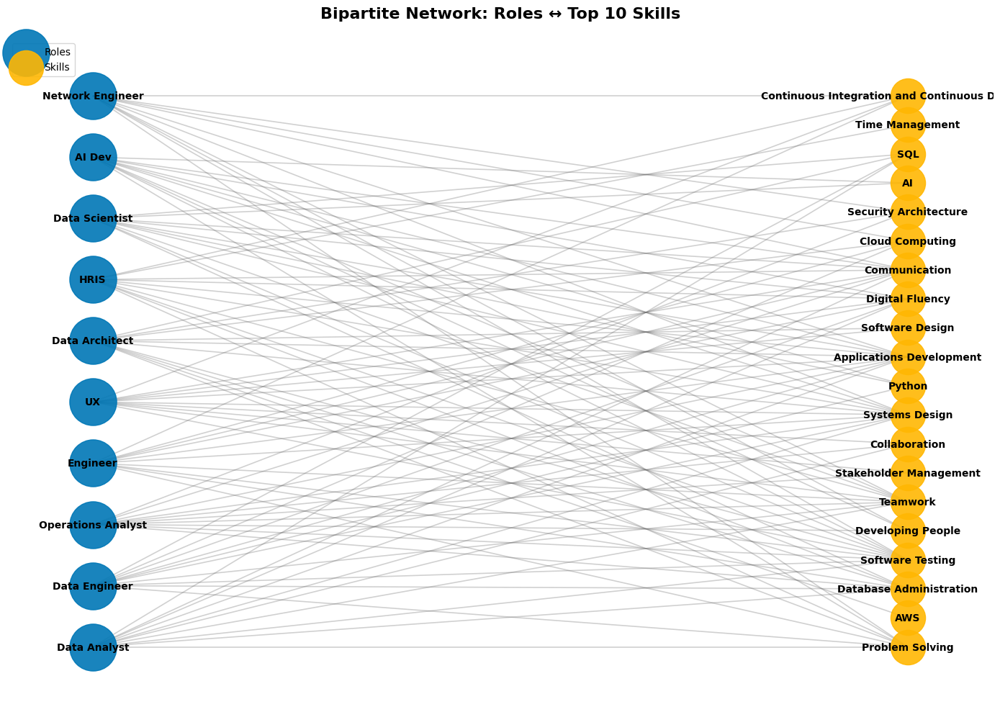

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# --- 1️⃣ Build bipartite graph (no weights) ---
B = nx.Graph()

for _, row in top10_skills_per_role.iterrows():
    role = row['Role_Category']
    skill = row['Skill']
    B.add_node(role, bipartite=0)
    B.add_node(skill, bipartite=1)
    B.add_edge(role, skill)

# --- 2️⃣ Separate node sets ---
roles = [n for n, d in B.nodes(data=True) if d['bipartite'] == 0]
skills = [n for n, d in B.nodes(data=True) if d['bipartite'] == 1]

pos = nx.bipartite_layout(B, roles, scale=2.5, align='vertical')
  # stable + spacious layout

# --- 4️⃣ Draw the network ---
plt.figure(figsize=(14, 10))
nx.draw_networkx_nodes(B, pos, nodelist=roles, node_color="#0077b6", node_size=2200, alpha=0.9, label="Roles")
nx.draw_networkx_nodes(B, pos, nodelist=skills, node_color="#ffb703", node_size=1200, alpha=0.9, label="Skills")

nx.draw_networkx_edges(B, pos, width=1.2, alpha=0.3, edge_color="#666666")
nx.draw_networkx_labels(B, pos, font_size=10, font_weight="bold", font_color="black")

plt.title("Bipartite Network: Roles ↔ Top 10 Skills", fontsize=16, fontweight='bold', pad=20)
plt.axis("off")
plt.legend(scatterpoints=1, loc="upper left", fontsize=10)
plt.tight_layout()
plt.show()


In [ ]:
role_to_plot = "Data Scientist"
df_role = df_ember[df_ember['Role_Category'].str.contains(role_to_plot, case=False, na=False)]


In [ ]:
df_ember.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11456 entries, 0 to 11455
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   title                11456 non-null  object 
 1   description_clean    11456 non-null  object 
 2   location             11456 non-null  object 
 3   date_posted          11456 non-null  object 
 4   min_amount           3490 non-null   float64
 5   max_amount           3490 non-null   float64
 6   Gemini_RR            11456 non-null  object 
 7   AAP_Skills           11456 non-null  object 
 8   Consolidated_Skills  11456 non-null  object 
 9   Role_Category        11456 non-null  object 
dtypes: float64(2), object(8)
memory usage: 895.1+ KB


In [ ]:
import pandas as pd
from collections import Counter
from itertools import chain

# Ensure all values are proper lists
df_role['Skill_List'] = (
    df_role['Consolidated_Skills']
    .fillna('')
    .astype(str)
    .str.split(r',\s*')
)

# Remove empty strings
df_role['Skill_List'] = df_role['Skill_List'].apply(
    lambda lst: [s for s in lst if s] if isinstance(lst, list) else []
)

# Count skills
skill_counts = Counter(chain.from_iterable(df_role['Skill_List']))
top10_skills = [skill for skill, _ in skill_counts.most_common(10)]


/tmp/ipython-input-2546781908.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_role['Skill_List'] = (
/tmp/ipython-input-2546781908.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_role['Skill_List'] = df_role['Skill_List'].apply(


In [ ]:
import re

def clean_skill(skill):
    if isinstance(skill, str):
        # Remove brackets, quotes, and extra whitespace
        return re.sub(r"[\[\]'\"\s]+", ' ', skill).strip()
    return skill

# Apply to all items in Skill_List
df_role['Skill_List'] = df_role['Skill_List'].apply(
    lambda lst: [clean_skill(s) for s in lst if isinstance(s, str)]
)


/tmp/ipython-input-4004252554.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_role['Skill_List'] = df_role['Skill_List'].apply(


In [ ]:
from collections import Counter
from itertools import chain

# Filter only list-like entries (skip NaN or others)
valid_skill_lists = [skills for skills in df_role['Skill_List'] if isinstance(skills, list)]

skill_counts = Counter(chain.from_iterable(valid_skill_lists))
top10_skills = [skill for skill, _ in skill_counts.most_common(10)]


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

B = nx.Graph()

# Add the role node
B.add_node(role_to_plot, bipartite=0)

# Add skill nodes and edges
for skill in top10_skills:
    B.add_node(skill, bipartite=1)
    B.add_edge(role_to_plot, skill)


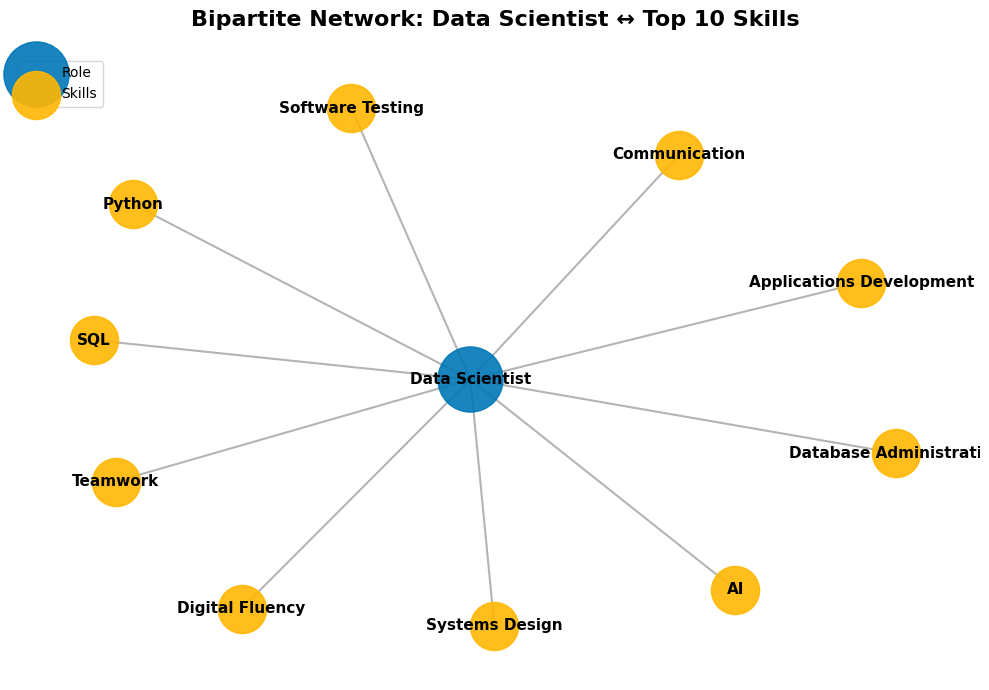

In [ ]:
pos = nx.spring_layout(B, seed=42, k=1.5)

plt.figure(figsize=(10, 7))
nx.draw_networkx_nodes(B, pos, nodelist=[role_to_plot], node_color="#0077b6", node_size=2200, alpha=0.9, label="Role")
nx.draw_networkx_nodes(B, pos, nodelist=top10_skills, node_color="#ffb703", node_size=1200, alpha=0.9, label="Skills")

nx.draw_networkx_edges(B, pos, width=1.5, alpha=0.4, edge_color="#444444")
nx.draw_networkx_labels(B, pos, font_size=11, font_weight="bold")

plt.title(f"Bipartite Network: {role_to_plot} ↔ Top 10 Skills", fontsize=16, fontweight='bold', pad=20)
plt.axis("off")
plt.legend(scatterpoints=1, loc="upper left", fontsize=10)
plt.tight_layout()
plt.show()


In [ ]:
df_ember.columns

Index(['title', 'description_clean', 'location', 'date_posted', 'min_amount',
       'max_amount', 'Gemini_RR', 'AAP_Skills', 'Consolidated_Skills',
       'Role_Category'],
      dtype='object')

In [ ]:
import ast
import re
import numpy as np
import pandas as pd

def clean_and_eval_skills(val):
    """Safely parse stringified or array-based skill lists, removing brackets, quotes, and whitespace."""

    # Case 1: Handle NaN / None
    if val is None or (isinstance(val, float) and pd.isna(val)):
        return []

    # Case 2: If it's already a list or array → flatten and clean
    if isinstance(val, (list, np.ndarray)):
        flat = [str(v).strip() for v in val if str(v).strip()]
        return [re.sub(r"[\[\]'\"\s]+", ' ', s).strip() for s in flat]

    # Case 3: If it's a string → try to evaluate it or split by comma
    val = str(val).strip()
    try:
        parsed = ast.literal_eval(val)
        if isinstance(parsed, (list, np.ndarray)):
            return [re.sub(r"[\[\]'\"\s]+", ' ', str(s)).strip() for s in parsed]
        else:
            # Single skill string
            return [re.sub(r"[\[\]'\"\s]+", ' ', str(parsed)).strip()]
    except Exception:
        # Fallback for comma-separated text
        skills = re.split(r',\s*', val)
        return [re.sub(r"[\[\]'\"\s]+", ' ', s).strip() for s in skills if s.strip()]

# ✅ Apply to your DataFrame
df_ember['Skill_List'] = df_ember['Consolidated_Skills'].apply(clean_and_eval_skills)


In [ ]:
roles_to_plot = ["Data Scientist", "Engineer"]
df_rolesub = df_ember[df_ember['Role_Category'].isin(roles_to_plot)]


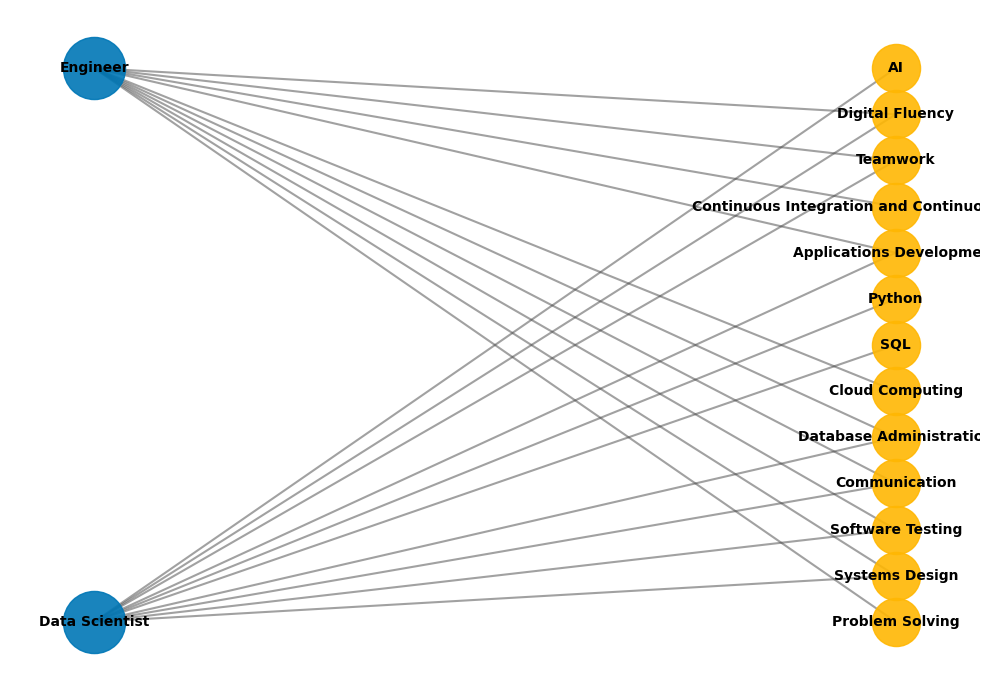

In [ ]:
import pandas as pd
import re, ast, networkx as nx, matplotlib.pyplot as plt
from collections import Counter
from itertools import chain

# --- assume df_ember['Skill_List'] is already cleaned as before ---

roles_to_plot = ["Engineer", "Data Scientist"]

# Step 1. Build top 10 skills per role (independently)
top_skills_per_role = {}
for role in roles_to_plot:
    skills = list(chain.from_iterable(df_ember.loc[df_ember['Role_Category'] == role, 'Skill_List']))
    counts = Counter(skills)
    top_skills_per_role[role] = [s for s, _ in counts.most_common(10)]

# Step 2. Combine all top skills (shared + unique)
all_top_skills = sorted(set(chain.from_iterable(top_skills_per_role.values())))

# Step 3. Build bipartite network
B = nx.Graph()
for role, skills in top_skills_per_role.items():
    B.add_node(role, bipartite=0)
    for skill in skills:
        B.add_node(skill, bipartite=1)
        B.add_edge(role, skill)

# Step 4. Layout and visualize
roles = [n for n, d in B.nodes(data=True) if d["bipartite"] == 0]
pos = nx.bipartite_layout(B, roles)

plt.figure(figsize=(10, 7))
nx.draw_networkx_nodes(B, pos, nodelist=roles_to_plot, node_color="#0077b6", node_size=2000, alpha=0.9, label="Roles")
nx.draw_networkx_nodes(B, pos, nodelist=all_top_skills, node_color="#ffb703", node_size=1200, alpha=0.9, label="Skills")
nx.draw_networkx_edges(B, pos, width=1.5, alpha=0.5, edge_color="#444444")
nx.draw_networkx_labels(B, pos, font_size=10, font_weight="bold")

plt.title("", fontsize=15, fontweight='bold', pad=20)
plt.axis("off")
plt.tight_layout()
plt.show()


/tmp/ipython-input-2208039930.py:102: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


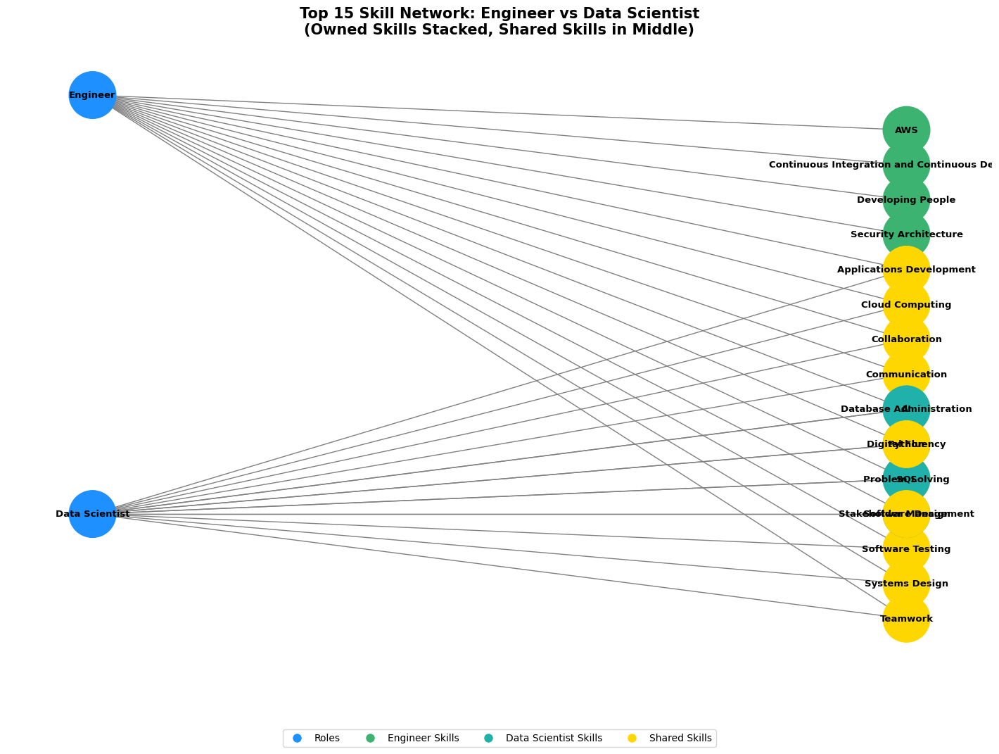

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
from collections import Counter
from itertools import chain

# --- Prepare data ---
roles = ["Engineer", "Data Scientist"]

# Extract top 15 skills per role
skills_per_role = {}
for role in roles:
    role_skills = (
        df_ember[df_ember['Role_Category'] == role]['Consolidated_Skills']
        .fillna('')
        .astype(str)
        .str.replace(r'[\[\]\'\"]', '', regex=True)
        .str.split(r',\s*')
    )
    all_skills = list(chain.from_iterable(role_skills))
    top15 = [s for s, _ in Counter(all_skills).most_common(15)]
    skills_per_role[role] = top15

# --- Identify shared and unique skills ---
shared_skills = set(skills_per_role[roles[0]]) & set(skills_per_role[roles[1]])
unique_engineer = set(skills_per_role[roles[0]]) - shared_skills
unique_datasci = set(skills_per_role[roles[1]]) - shared_skills

# --- Build bipartite graph ---
B = nx.Graph()
B.add_nodes_from(roles, bipartite=0)
B.add_nodes_from(shared_skills | unique_engineer | unique_datasci, bipartite=1)

# Add edges for both roles
for skill in skills_per_role[roles[0]]:
    B.add_edge(roles[0], skill)
for skill in skills_per_role[roles[1]]:
    B.add_edge(roles[1], skill)

# --- Define improved layout (stacked view) ---
pos = {}

# Role node positions
pos[roles[0]] = (0, 3)   # Engineer on top
pos[roles[1]] = (0, -3)  # Data Scientist below

# Engineer-only skills (clustered above shared zone)
eng_sorted = sorted(unique_engineer)
for i, skill in enumerate(eng_sorted):
    pos[skill] = (1, 2.5 - i * 0.5)

# Data Scientist-only skills (clustered below shared zone)
data_sorted = sorted(unique_datasci)
for i, skill in enumerate(data_sorted):
    pos[skill] = (1, -1.5 - i * 0.5)

# Shared skills (center vertical stack)
shared_sorted = sorted(shared_skills)
for i, skill in enumerate(shared_sorted):
    pos[skill] = (1, 0.5 - i * 0.5)

# --- Colors ---
color_map = []
for node in B.nodes():
    if node in roles:
        color_map.append("dodgerblue")
    elif node in shared_skills:
        color_map.append("gold")
    elif node in unique_engineer:
        color_map.append("mediumseagreen")
    else:
        color_map.append("lightseagreen")

# --- Draw network ---
plt.figure(figsize=(14, 9))
nx.draw(
    B,
    pos,
    with_labels=True,
    node_color=color_map,
    node_size=2300,
    font_size=9.5,
    font_weight="bold",
    edge_color="gray",
)

# --- Legend ---
plt.legend(
    handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='Roles', markerfacecolor='dodgerblue', markersize=10),
        plt.Line2D([0], [0], marker='o', color='w', label='Engineer Skills', markerfacecolor='mediumseagreen', markersize=10),
        plt.Line2D([0], [0], marker='o', color='w', label='Data Scientist Skills', markerfacecolor='lightseagreen', markersize=10),
        plt.Line2D([0], [0], marker='o', color='w', label='Shared Skills', markerfacecolor='gold', markersize=10)
    ],
    loc='upper center',
    bbox_to_anchor=(0.5, -0.08),
    ncol=4
)

plt.title("Top 15 Skill Network: Engineer vs Data Scientist\n(Owned Skills Stacked, Shared Skills in Middle)",
          fontsize=15, weight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()


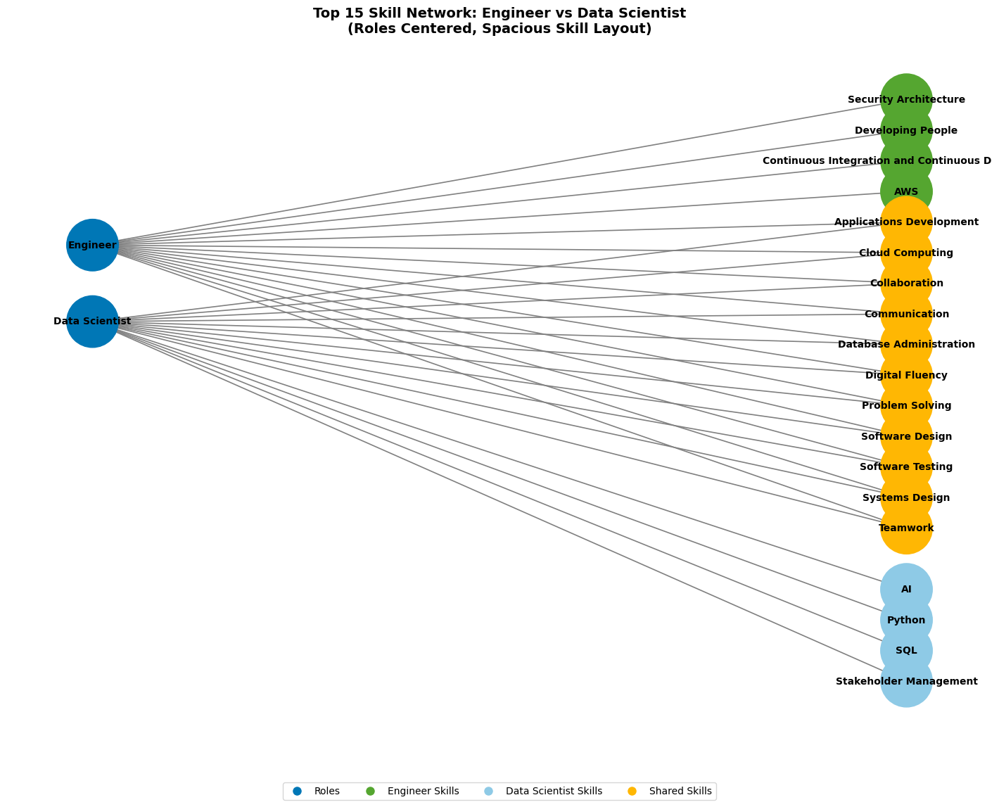

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
from collections import Counter
from itertools import chain

# --- Prepare data ---
roles = ["Engineer", "Data Scientist"]

# Extract skills per role
skills_per_role = {}
for role in roles:
    role_skills = (
        df_ember[df_ember['Role_Category'] == role]['Consolidated_Skills']
        .fillna('')
        .astype(str)
        .str.replace(r'[\[\]\'\"]', '', regex=True)
        .str.split(r',\s*')
    )
    all_skills = list(chain.from_iterable(role_skills))
    top15 = [s for s, _ in Counter(all_skills).most_common(15)]
    skills_per_role[role] = top15

# --- Find shared & unique skills ---
shared_skills = set(skills_per_role[roles[0]]) & set(skills_per_role[roles[1]])
unique_engineer = set(skills_per_role[roles[0]]) - shared_skills
unique_datasci = set(skills_per_role[roles[1]]) - shared_skills

# --- Build graph ---
B = nx.Graph()
B.add_nodes_from(roles, bipartite=0)
B.add_nodes_from(shared_skills | unique_engineer | unique_datasci, bipartite=1)

for skill in skills_per_role[roles[0]]:
    B.add_edge(roles[0], skill)
for skill in skills_per_role[roles[1]]:
    B.add_edge(roles[1], skill)

# --- Define improved layout ---
pos = {}

# Place roles close to each other on the left middle
pos["Engineer"] = (-2, 1.5)
pos["Data Scientist"] = (-2, -1.5)

# Increase vertical spacing for skills
vspace = 1.2

# Sort skills for visual order
shared_sorted = sorted(shared_skills)
eng_sorted = sorted(unique_engineer)
data_sorted = sorted(unique_datasci)

# Assign positions: shared in middle, Engineer’s unique above, Data Scientist’s below
y_shared_start = len(eng_sorted) * vspace / 2
for i, skill in enumerate(shared_sorted):
    pos[skill] = (2, y_shared_start - i * vspace)

for i, skill in enumerate(eng_sorted):
    pos[skill] = (2, y_shared_start + (i + 1) * vspace)

for i, skill in enumerate(data_sorted):
    pos[skill] = (2, y_shared_start - (len(shared_sorted) + i + 1) * vspace)

# --- Colors ---
color_map = []
for node in B.nodes():
    if node in roles:
        color_map.append("#0077b6")        # Roles: blue
    elif node in shared_skills:
        color_map.append("#ffb703")        # Shared: gold
    elif node in unique_engineer:
        color_map.append("#55a630")        # Engineer: green
    else:
        color_map.append("#8ecae6")        # Data Scientist: light blue

# --- Draw ---
plt.figure(figsize=(14, 10))
nx.draw(
    B,
    pos,
    with_labels=True,
    node_color=color_map,
    node_size=2800,
    font_size=10,
    font_weight="bold",
    edge_color="gray",
    width=1.2,
)

# Legend
plt.legend(
    handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='Roles', markerfacecolor='#0077b6', markersize=10),
        plt.Line2D([0], [0], marker='o', color='w', label='Engineer Skills', markerfacecolor='#55a630', markersize=10),
        plt.Line2D([0], [0], marker='o', color='w', label='Data Scientist Skills', markerfacecolor='#8ecae6', markersize=10),
        plt.Line2D([0], [0], marker='o', color='w', label='Shared Skills', markerfacecolor='#ffb703', markersize=10)
    ],
    loc='upper center',
    bbox_to_anchor=(0.5, -0.05),
    ncol=4
)

plt.title("Top 15 Skill Network: Engineer vs Data Scientist\n(Roles Centered, Spacious Skill Layout)", fontsize=14, weight='bold')
plt.axis('off')
plt.show()


/tmp/ipython-input-3355111506.py:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


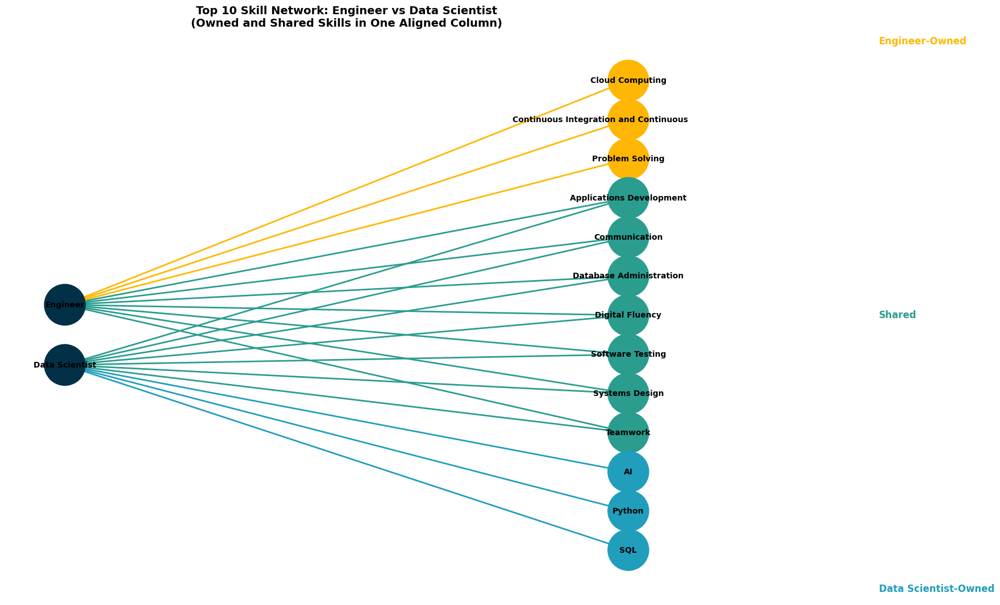

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
from collections import Counter
from itertools import chain

# --- Prepare data ---
roles = ["Engineer", "Data Scientist"]

# Extract top 10 skills per role
skills_per_role = {}
for role in roles:
    role_skills = (
        df_ember[df_ember['Role_Category'] == role]['Consolidated_Skills']
        .fillna('')
        .astype(str)
        .str.replace(r'[\[\]\'\"]', '', regex=True)
        .str.split(r',\s*')
    )
    all_skills = list(chain.from_iterable(role_skills))
    top10 = [s for s, _ in Counter(all_skills).most_common(10)]
    skills_per_role[role] = top10

# --- Find shared & unique skills ---
shared_skills = set(skills_per_role[roles[0]]) & set(skills_per_role[roles[1]])
unique_engineer = set(skills_per_role[roles[0]]) - shared_skills
unique_datasci = set(skills_per_role[roles[1]]) - shared_skills

# --- Build graph ---
B = nx.Graph()
B.add_nodes_from(roles, bipartite=0)
B.add_nodes_from(shared_skills | unique_engineer | unique_datasci, bipartite=1)

for skill in skills_per_role[roles[0]]:
    B.add_edge(roles[0], skill)
for skill in skills_per_role[roles[1]]:
    B.add_edge(roles[1], skill)

# --- Define layout ---
pos = {}
vspace = 1.3  # vertical spacing

# Roles on left, centered
pos["Engineer"] = (-3, 1)
pos["Data Scientist"] = (-3, -1)

# Order vertically: engineer-owned on top, shared in middle, data sci-owned at bottom
eng_sorted = sorted(unique_engineer)
shared_sorted = sorted(shared_skills)
data_sorted = sorted(unique_datasci)

# Compute y positions for stacked layout
all_skills_ordered = eng_sorted + list(shared_sorted) + data_sorted
total_skills = len(all_skills_ordered)
start_y = total_skills / 2 * vspace

for i, skill in enumerate(all_skills_ordered):
    pos[skill] = (1.5, start_y - i * vspace)

# --- Colors ---
node_colors = []
edge_colors = []

for node in B.nodes():
    if node in roles:
        node_colors.append("#023047")  # Roles dark blue
    elif node in unique_engineer:
        node_colors.append("#ffb703")  # Engineer-owned yellow
    elif node in unique_datasci:
        node_colors.append("#219ebc")  # Data Scientist-owned blue
    else:
        node_colors.append("#2a9d8f")  # Shared green

for u, v in B.edges():
    if v in unique_engineer:
        edge_colors.append("#ffb703")
    elif v in unique_datasci:
        edge_colors.append("#219ebc")
    else:
        edge_colors.append("#2a9d8f")

# --- Draw ---
plt.figure(figsize=(12, 10))
nx.draw(
    B,
    pos,
    with_labels=True,
    node_color=node_colors,
    edge_color=edge_colors,
    node_size=2700,
    font_size=10,
    font_weight="bold",
    width=2
)

# --- Inline section labels ---
# Compute vertical midpoints
eng_top_y = pos[eng_sorted[0]][1] + vspace if eng_sorted else start_y
shared_mid_y = pos[list(shared_sorted)[len(shared_sorted)//2]][1] if shared_sorted else 0
data_bottom_y = pos[data_sorted[-1]][1] - vspace if data_sorted else -start_y

plt.text(3.5, eng_top_y, "Engineer-Owned", fontsize=12, color="#ffb703", fontweight="bold", ha="left", va="center")
plt.text(3.5, shared_mid_y, "Shared", fontsize=12, color="#2a9d8f", fontweight="bold", ha="left", va="center")
plt.text(3.5, data_bottom_y, "Data Scientist-Owned", fontsize=12, color="#219ebc", fontweight="bold", ha="left", va="center")

# --- Title ---
plt.title("Top 10 Skill Network: Engineer vs Data Scientist\n(Owned and Shared Skills in One Aligned Column)",
          fontsize=14, weight='bold')
plt.axis("off")
plt.tight_layout()
plt.show()


/tmp/ipython-input-4119993410.py:108: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


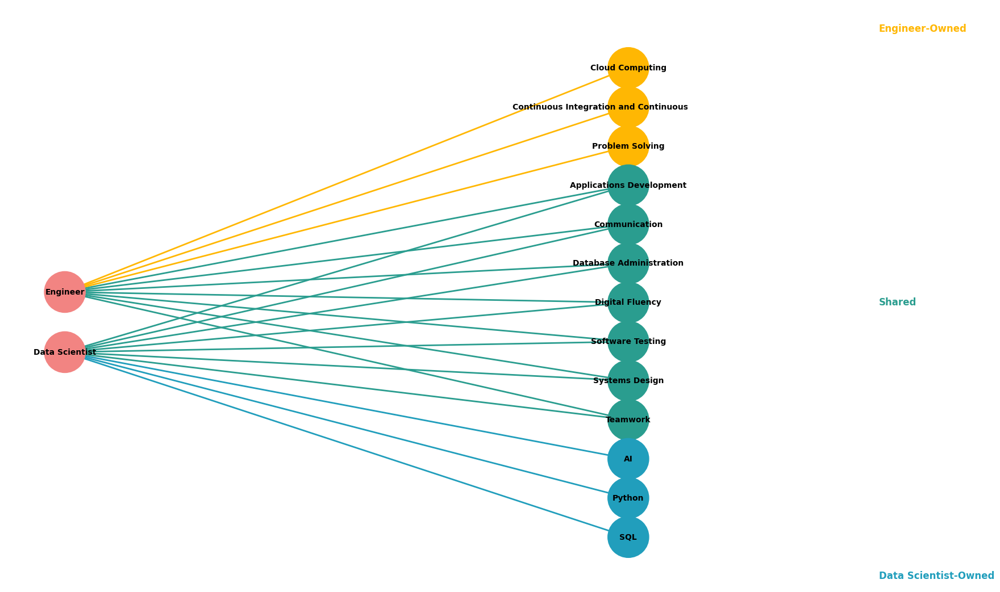

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
from collections import Counter
from itertools import chain

# --- Prepare data ---
roles = ["Engineer", "Data Scientist"]

# Extract top 10 skills per role
skills_per_role = {}
for role in roles:
    role_skills = (
        df_ember[df_ember['Role_Category'] == role]['Consolidated_Skills']
        .fillna('')
        .astype(str)
        .str.replace(r'[\[\]\'\"]', '', regex=True)
        .str.split(r',\s*')
    )
    all_skills = list(chain.from_iterable(role_skills))
    top10 = [s for s, _ in Counter(all_skills).most_common(10)]
    skills_per_role[role] = top10

# --- Find shared & unique skills ---
shared_skills = set(skills_per_role[roles[0]]) & set(skills_per_role[roles[1]])
unique_engineer = set(skills_per_role[roles[0]]) - shared_skills
unique_datasci = set(skills_per_role[roles[1]]) - shared_skills

# --- Build graph ---
B = nx.Graph()
B.add_nodes_from(roles, bipartite=0)
B.add_nodes_from(shared_skills | unique_engineer | unique_datasci, bipartite=1)

for skill in skills_per_role[roles[0]]:
    B.add_edge(roles[0], skill)
for skill in skills_per_role[roles[1]]:
    B.add_edge(roles[1], skill)

# --- Define layout ---
pos = {}
vspace = 1.3  # vertical spacing

# Roles on left, centered
pos["Engineer"] = (-3, 1)
pos["Data Scientist"] = (-3, -1)

# Order vertically: engineer-owned (top), shared (middle), data sci-owned (bottom)
eng_sorted = sorted(unique_engineer)
shared_sorted = sorted(shared_skills)
data_sorted = sorted(unique_datasci)

# Compute y positions for stacked layout
all_skills_ordered = eng_sorted + list(shared_sorted) + data_sorted
total_skills = len(all_skills_ordered)
start_y = total_skills / 2 * vspace

for i, skill in enumerate(all_skills_ordered):
    pos[skill] = (1.5, start_y - i * vspace)

# --- Colors ---
node_colors = []
edge_colors = []

for node in B.nodes():
    if node in roles:
        node_colors.append("#f28482")  # Roles light red
    elif node in unique_engineer:
        node_colors.append("#ffb703")  # Engineer-owned yellow
    elif node in unique_datasci:
        node_colors.append("#219ebc")  # Data Scientist-owned blue
    else:
        node_colors.append("#2a9d8f")  # Shared green

for u, v in B.edges():
    if v in unique_engineer:
        edge_colors.append("#ffb703")
    elif v in unique_datasci:
        edge_colors.append("#219ebc")
    else:
        edge_colors.append("#2a9d8f")

# --- Draw ---
plt.figure(figsize=(12, 10))
nx.draw(
    B,
    pos,
    with_labels=True,
    node_color=node_colors,
    edge_color=edge_colors,
    node_size=2700,
    font_size=10,
    font_weight="bold",
    width=2
)

# --- Inline section labels ---
eng_top_y = pos[eng_sorted[0]][1] + vspace if eng_sorted else start_y
shared_mid_y = pos[list(shared_sorted)[len(shared_sorted)//2]][1] if shared_sorted else 0
data_bottom_y = pos[data_sorted[-1]][1] - vspace if data_sorted else -start_y

plt.text(3.5, eng_top_y, "Engineer-Owned", fontsize=12, color="#ffb703", fontweight="bold", ha="left", va="center")
plt.text(3.5, shared_mid_y, "Shared", fontsize=12, color="#2a9d8f", fontweight="bold", ha="left", va="center")
plt.text(3.5, data_bottom_y, "Data Scientist-Owned", fontsize=12, color="#219ebc", fontweight="bold", ha="left", va="center")

# --- Title ---
plt.title(" ",
          fontsize=14, weight='bold')
plt.axis("off")
plt.tight_layout()
plt.show()


/tmp/ipython-input-1992013920.py:108: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


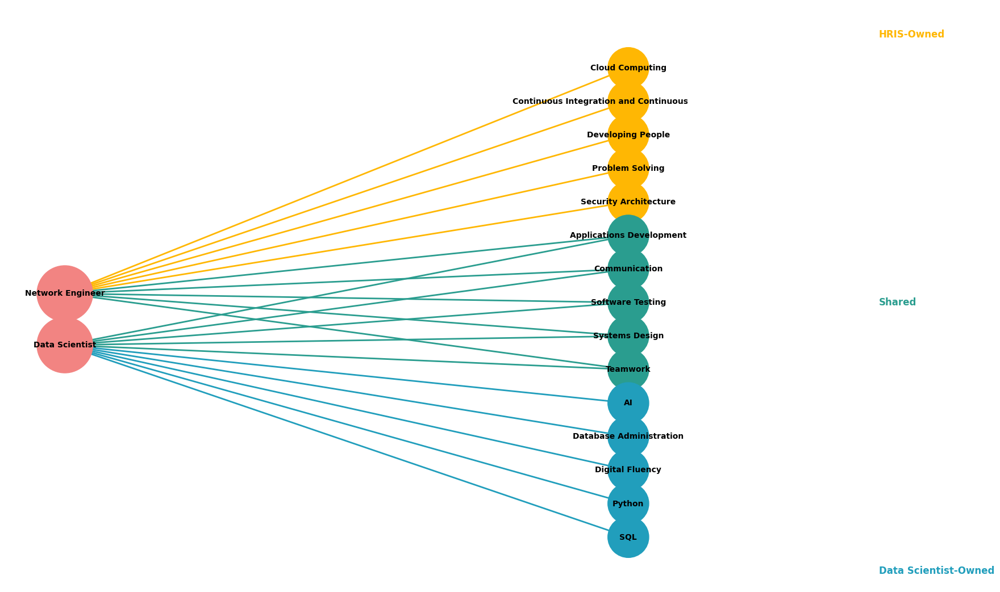

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
from collections import Counter
from itertools import chain

# --- Prepare data ---
roles = ["Network Engineer", "Data Scientist"]

# Extract top 10 skills per role
skills_per_role = {}
for role in roles:
    role_skills = (
        df_ember[df_ember['Role_Category'] == role]['Consolidated_Skills']
        .fillna('')
        .astype(str)
        .str.replace(r'[\[\]\'\"]', '', regex=True)
        .str.split(r',\s*')
    )
    all_skills = list(chain.from_iterable(role_skills))
    top10 = [s for s, _ in Counter(all_skills).most_common(10)]
    skills_per_role[role] = top10

# --- Find shared & unique skills ---
shared_skills = set(skills_per_role[roles[0]]) & set(skills_per_role[roles[1]])
unique_hirs = set(skills_per_role[roles[0]]) - shared_skills
unique_datasci = set(skills_per_role[roles[1]]) - shared_skills

# --- Build graph ---
B = nx.Graph()
B.add_nodes_from(roles, bipartite=0)
B.add_nodes_from(shared_skills | unique_hirs | unique_datasci, bipartite=1)

for skill in skills_per_role[roles[0]]:
    B.add_edge(roles[0], skill)
for skill in skills_per_role[roles[1]]:
    B.add_edge(roles[1], skill)

# --- Define layout ---
pos = {}
vspace = 1.3  # vertical spacing

# Roles on left, centered
pos["Network Engineer"] = (-3, 1)
pos["Data Scientist"] = (-3, -1)

# Order vertically: HRIS-owned (top), shared (middle), Data Sci-owned (bottom)
hirs_sorted = sorted(unique_hirs)
shared_sorted = sorted(shared_skills)
data_sorted = sorted(unique_datasci)

# Compute y positions for stacked layout
all_skills_ordered = hirs_sorted + list(shared_sorted) + data_sorted
total_skills = len(all_skills_ordered)
start_y = total_skills / 2 * vspace

for i, skill in enumerate(all_skills_ordered):
    pos[skill] = (1.5, start_y - i * vspace)

# --- Colors ---
node_colors = []
edge_colors = []

for node in B.nodes():
    if node in roles:
        node_colors.append("#f28482")  # Roles light red
    elif node in unique_hirs:
        node_colors.append("#ffb703")  # HRIS-owned yellow
    elif node in unique_datasci:
        node_colors.append("#219ebc")  # Data Scientist-owned blue
    else:
        node_colors.append("#2a9d8f")  # Shared green

for u, v in B.edges():
    if v in unique_hirs:
        edge_colors.append("#ffb703")
    elif v in unique_datasci:
        edge_colors.append("#219ebc")
    else:
        edge_colors.append("#2a9d8f")

# --- Draw ---
plt.figure(figsize=(12, 10))
nx.draw(
    B,
    pos,
    with_labels=True,
    node_color=node_colors,
    edge_color=edge_colors,
    node_size=[5000 if n in roles else 2700 for n in B.nodes()],  # Larger role circles
    font_size=10,
    font_weight="bold",
    width=2
)

# --- Inline section labels ---
hirs_top_y = pos[hirs_sorted[0]][1] + vspace if hirs_sorted else start_y
shared_mid_y = pos[list(shared_sorted)[len(shared_sorted)//2]][1] if shared_sorted else 0
data_bottom_y = pos[data_sorted[-1]][1] - vspace if data_sorted else -start_y

plt.text(3.5, hirs_top_y, "HRIS-Owned", fontsize=12, color="#ffb703", fontweight="bold", ha="left", va="center")
plt.text(3.5, shared_mid_y, "Shared", fontsize=12, color="#2a9d8f", fontweight="bold", ha="left", va="center")
plt.text(3.5, data_bottom_y, "Data Scientist-Owned", fontsize=12, color="#219ebc", fontweight="bold", ha="left", va="center")

# --- Title ---
plt.title(" ",
          fontsize=14, weight='bold')
plt.axis("off")
plt.tight_layout()
plt.show()


/tmp/ipython-input-3772185282.py:108: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


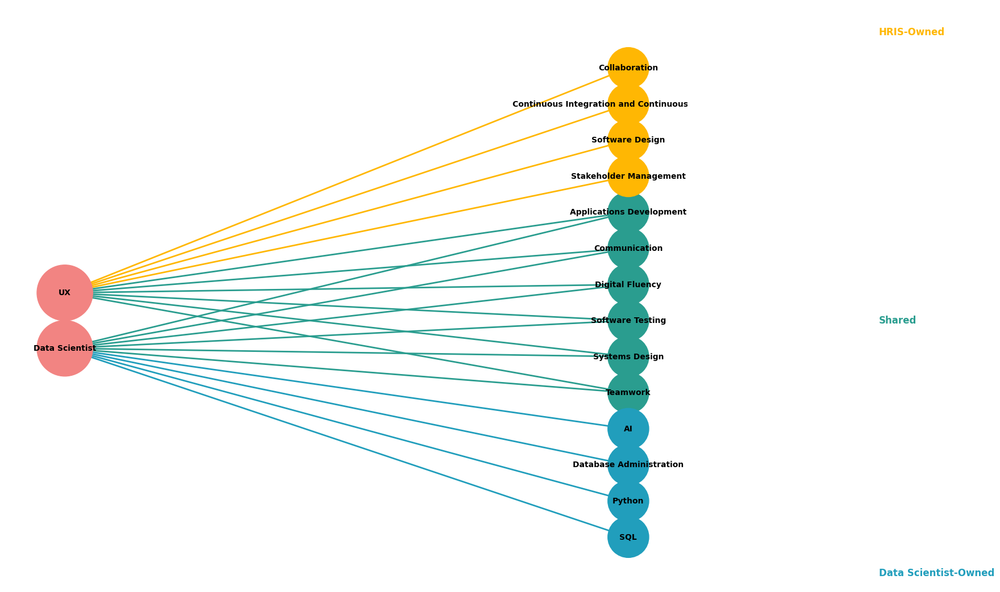

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
from collections import Counter
from itertools import chain

# --- Prepare data ---
roles = ["UX", "Data Scientist"]

# Extract top 10 skills per role
skills_per_role = {}
for role in roles:
    role_skills = (
        df_ember[df_ember['Role_Category'] == role]['Consolidated_Skills']
        .fillna('')
        .astype(str)
        .str.replace(r'[\[\]\'\"]', '', regex=True)
        .str.split(r',\s*')
    )
    all_skills = list(chain.from_iterable(role_skills))
    top10 = [s for s, _ in Counter(all_skills).most_common(10)]
    skills_per_role[role] = top10

# --- Find shared & unique skills ---
shared_skills = set(skills_per_role[roles[0]]) & set(skills_per_role[roles[1]])
unique_hirs = set(skills_per_role[roles[0]]) - shared_skills
unique_datasci = set(skills_per_role[roles[1]]) - shared_skills

# --- Build graph ---
B = nx.Graph()
B.add_nodes_from(roles, bipartite=0)
B.add_nodes_from(shared_skills | unique_hirs | unique_datasci, bipartite=1)

for skill in skills_per_role[roles[0]]:
    B.add_edge(roles[0], skill)
for skill in skills_per_role[roles[1]]:
    B.add_edge(roles[1], skill)

# --- Define layout ---
pos = {}
vspace = 1.3  # vertical spacing

# Roles on left, centered
pos["UX"] = (-3, 1)
pos["Data Scientist"] = (-3, -1)

# Order vertically: HRIS-owned (top), shared (middle), Data Sci-owned (bottom)
hirs_sorted = sorted(unique_hirs)
shared_sorted = sorted(shared_skills)
data_sorted = sorted(unique_datasci)

# Compute y positions for stacked layout
all_skills_ordered = hirs_sorted + list(shared_sorted) + data_sorted
total_skills = len(all_skills_ordered)
start_y = total_skills / 2 * vspace

for i, skill in enumerate(all_skills_ordered):
    pos[skill] = (1.5, start_y - i * vspace)

# --- Colors ---
node_colors = []
edge_colors = []

for node in B.nodes():
    if node in roles:
        node_colors.append("#f28482")  # Roles light red
    elif node in unique_hirs:
        node_colors.append("#ffb703")  # HRIS-owned yellow
    elif node in unique_datasci:
        node_colors.append("#219ebc")  # Data Scientist-owned blue
    else:
        node_colors.append("#2a9d8f")  # Shared green

for u, v in B.edges():
    if v in unique_hirs:
        edge_colors.append("#ffb703")
    elif v in unique_datasci:
        edge_colors.append("#219ebc")
    else:
        edge_colors.append("#2a9d8f")

# --- Draw ---
plt.figure(figsize=(12, 10))
nx.draw(
    B,
    pos,
    with_labels=True,
    node_color=node_colors,
    edge_color=edge_colors,
    node_size=[5000 if n in roles else 2700 for n in B.nodes()],  # Larger role circles
    font_size=10,
    font_weight="bold",
    width=2
)

# --- Inline section labels ---
hirs_top_y = pos[hirs_sorted[0]][1] + vspace if hirs_sorted else start_y
shared_mid_y = pos[list(shared_sorted)[len(shared_sorted)//2]][1] if shared_sorted else 0
data_bottom_y = pos[data_sorted[-1]][1] - vspace if data_sorted else -start_y

plt.text(3.5, hirs_top_y, "HRIS-Owned", fontsize=12, color="#ffb703", fontweight="bold", ha="left", va="center")
plt.text(3.5, shared_mid_y, "Shared", fontsize=12, color="#2a9d8f", fontweight="bold", ha="left", va="center")
plt.text(3.5, data_bottom_y, "Data Scientist-Owned", fontsize=12, color="#219ebc", fontweight="bold", ha="left", va="center")

# --- Title ---
plt.title(" ",
          fontsize=14, weight='bold')
plt.axis("off")
plt.tight_layout()
plt.show()


/tmp/ipython-input-891198985.py:108: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


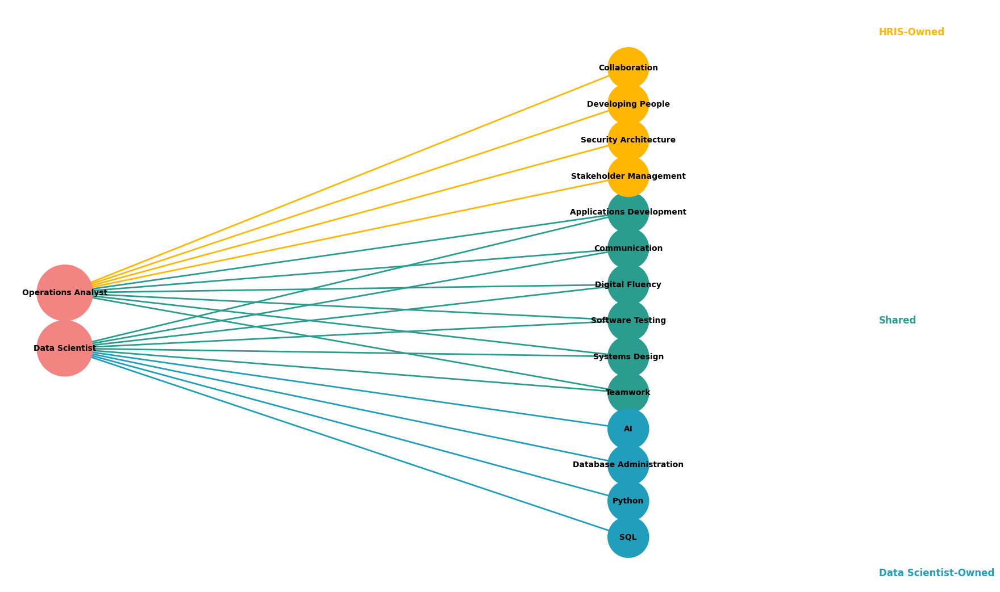

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
from collections import Counter
from itertools import chain

# --- Prepare data ---
roles = ["Operations Analyst", "Data Scientist"]

# Extract top 10 skills per role
skills_per_role = {}
for role in roles:
    role_skills = (
        df_ember[df_ember['Role_Category'] == role]['Consolidated_Skills']
        .fillna('')
        .astype(str)
        .str.replace(r'[\[\]\'\"]', '', regex=True)
        .str.split(r',\s*')
    )
    all_skills = list(chain.from_iterable(role_skills))
    top10 = [s for s, _ in Counter(all_skills).most_common(10)]
    skills_per_role[role] = top10

# --- Find shared & unique skills ---
shared_skills = set(skills_per_role[roles[0]]) & set(skills_per_role[roles[1]])
unique_hirs = set(skills_per_role[roles[0]]) - shared_skills
unique_datasci = set(skills_per_role[roles[1]]) - shared_skills

# --- Build graph ---
B = nx.Graph()
B.add_nodes_from(roles, bipartite=0)
B.add_nodes_from(shared_skills | unique_hirs | unique_datasci, bipartite=1)

for skill in skills_per_role[roles[0]]:
    B.add_edge(roles[0], skill)
for skill in skills_per_role[roles[1]]:
    B.add_edge(roles[1], skill)

# --- Define layout ---
pos = {}
vspace = 1.3  # vertical spacing

# Roles on left, centered
pos["Operations Analyst"] = (-3, 1)
pos["Data Scientist"] = (-3, -1)

# Order vertically: HRIS-owned (top), shared (middle), Data Sci-owned (bottom)
hirs_sorted = sorted(unique_hirs)
shared_sorted = sorted(shared_skills)
data_sorted = sorted(unique_datasci)

# Compute y positions for stacked layout
all_skills_ordered = hirs_sorted + list(shared_sorted) + data_sorted
total_skills = len(all_skills_ordered)
start_y = total_skills / 2 * vspace

for i, skill in enumerate(all_skills_ordered):
    pos[skill] = (1.5, start_y - i * vspace)

# --- Colors ---
node_colors = []
edge_colors = []

for node in B.nodes():
    if node in roles:
        node_colors.append("#f28482")  # Roles light red
    elif node in unique_hirs:
        node_colors.append("#ffb703")  # HRIS-owned yellow
    elif node in unique_datasci:
        node_colors.append("#219ebc")  # Data Scientist-owned blue
    else:
        node_colors.append("#2a9d8f")  # Shared green

for u, v in B.edges():
    if v in unique_hirs:
        edge_colors.append("#ffb703")
    elif v in unique_datasci:
        edge_colors.append("#219ebc")
    else:
        edge_colors.append("#2a9d8f")

# --- Draw ---
plt.figure(figsize=(12, 10))
nx.draw(
    B,
    pos,
    with_labels=True,
    node_color=node_colors,
    edge_color=edge_colors,
    node_size=[5000 if n in roles else 2700 for n in B.nodes()],  # Larger role circles
    font_size=10,
    font_weight="bold",
    width=2
)

# --- Inline section labels ---
hirs_top_y = pos[hirs_sorted[0]][1] + vspace if hirs_sorted else start_y
shared_mid_y = pos[list(shared_sorted)[len(shared_sorted)//2]][1] if shared_sorted else 0
data_bottom_y = pos[data_sorted[-1]][1] - vspace if data_sorted else -start_y

plt.text(3.5, hirs_top_y, "HRIS-Owned", fontsize=12, color="#ffb703", fontweight="bold", ha="left", va="center")
plt.text(3.5, shared_mid_y, "Shared", fontsize=12, color="#2a9d8f", fontweight="bold", ha="left", va="center")
plt.text(3.5, data_bottom_y, "Data Scientist-Owned", fontsize=12, color="#219ebc", fontweight="bold", ha="left", va="center")

# --- Title ---
plt.title(" ",
          fontsize=14, weight='bold')
plt.axis("off")
plt.tight_layout()
plt.show()


In [ ]:
# valid_skill_lists = [skills for skills in df_role['Skill_List'] if isinstance(skills, list)]

# skill_counts = Counter(chain.from_iterable(valid_skill_lists))
# top10_skills = [skill for skill, _ in skill_counts.most_common(10)]

# B = nx.Graph()

# # Add the role node
# B.add_node(role_to_plot, bipartite=0)

# # Add skill nodes and edges
# for skill in top10_skills:
#     B.add_node(skill, bipartite=1)
#     B.add_edge(role_to_plot, skill)

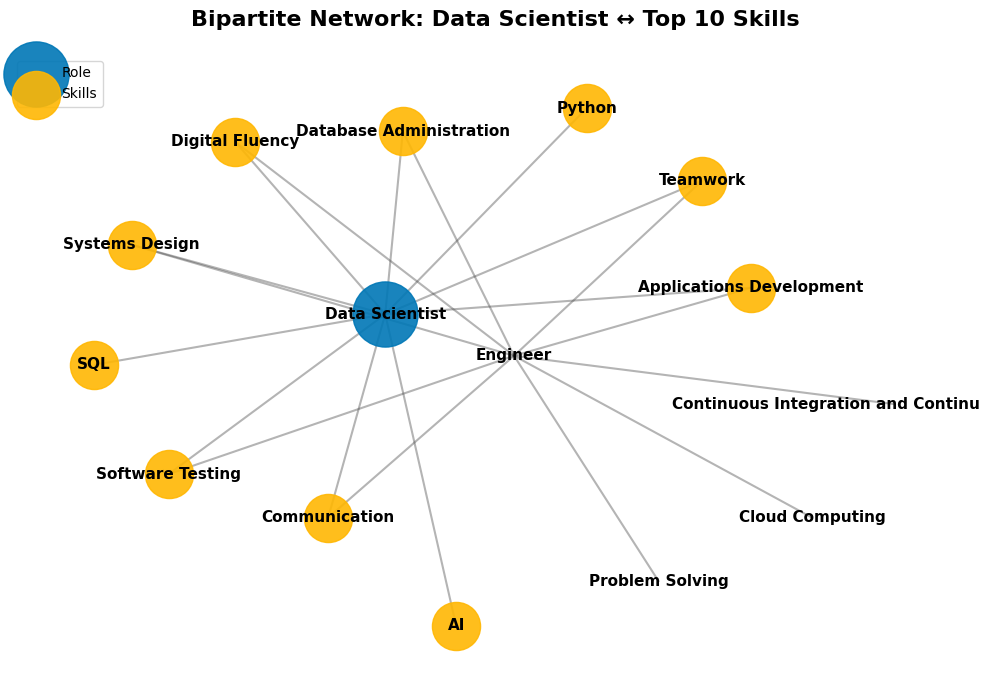

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

B = nx.Graph()

# Add nodes and edges
for role, skills in top_skills_per_role.items():
    B.add_node(role, bipartite=0)
    for skill in skills:
        B.add_node(skill, bipartite=1)
        B.add_edge(role, skill)
pos = nx.spring_layout(B, seed=42, k=1.5)

plt.figure(figsize=(10, 7))
nx.draw_networkx_nodes(B, pos, nodelist=[role_to_plot], node_color="#0077b6", node_size=2200, alpha=0.9, label="Role")
nx.draw_networkx_nodes(B, pos, nodelist=top10_skills, node_color="#ffb703", node_size=1200, alpha=0.9, label="Skills")

nx.draw_networkx_edges(B, pos, width=1.5, alpha=0.4, edge_color="#444444")
nx.draw_networkx_labels(B, pos, font_size=11, font_weight="bold")

plt.title(f"Bipartite Network: {role_to_plot} ↔ Top 10 Skills", fontsize=16, fontweight='bold', pad=20)
plt.axis("off")
plt.legend(scatterpoints=1, loc="upper left", fontsize=10)
plt.tight_layout()
plt.show()


In [ ]:
for role, skills in top_skills_per_role.items():
    for s in skills:
        if isinstance(s, list):
            print(f"⚠️ Nested list found in role: {role} -> {s}")


In [ ]:
[i for i in top10_skills if isinstance(i, list)]


[]

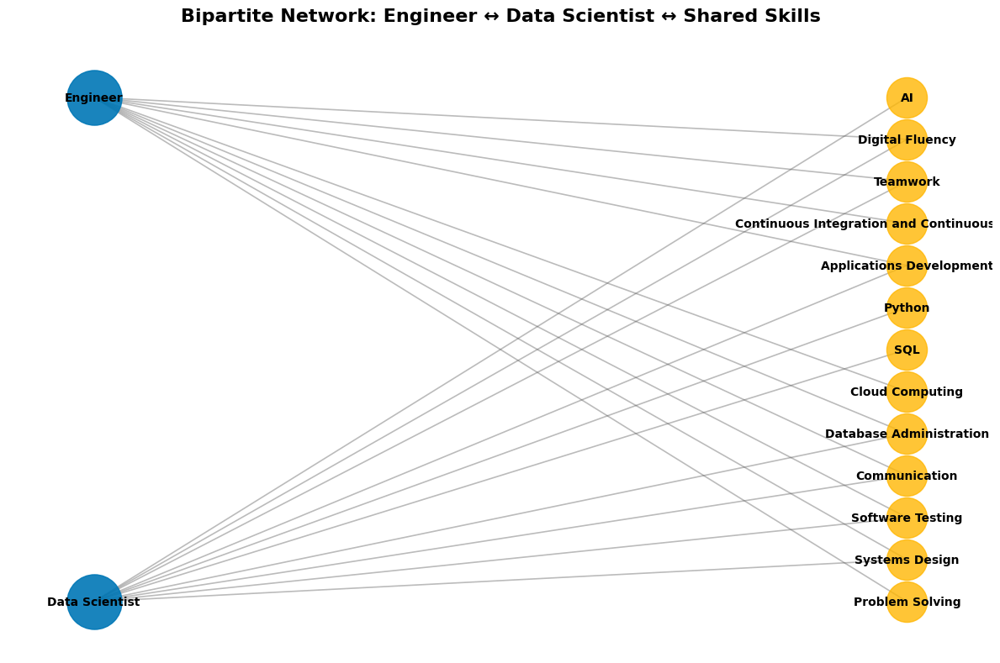

In [ ]:
# Separate the two node sets
roles = [n for n, d in B.nodes(data=True) if d['bipartite'] == 0]
skills = [n for n, d in B.nodes(data=True) if d['bipartite'] == 1]

# Stable and spacious bipartite layout
pos = nx.bipartite_layout(B, roles, align='vertical', scale=2.5)

plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(B, pos, nodelist=roles, node_color="#0077b6", node_size=2200, alpha=0.9, label="Roles")
nx.draw_networkx_nodes(B, pos, nodelist=skills, node_color="#ffb703", node_size=1200, alpha=0.8, label="Skills")

nx.draw_networkx_edges(B, pos, width=1.2, alpha=0.4, edge_color="#555555")
nx.draw_networkx_labels(B, pos, font_size=10, font_weight="bold")

plt.title(f"Bipartite Network: {roles_to_plot[0]} ↔ {roles_to_plot[1]} ↔ Shared Skills",
          fontsize=16, fontweight='bold', pad=20)
plt.axis("off")
plt.tight_layout()
plt.show()


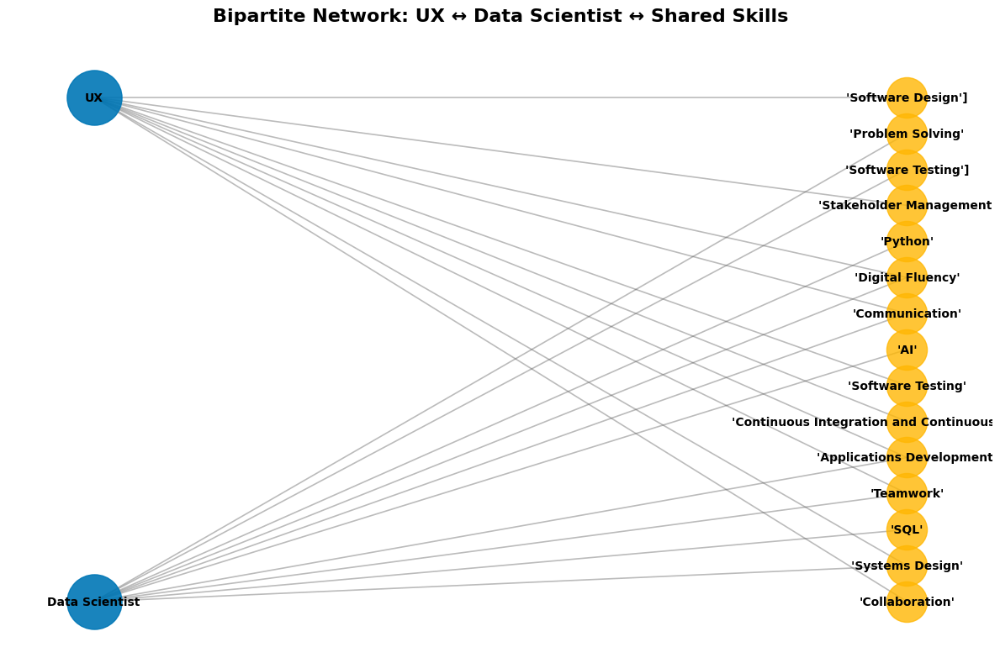

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
from collections import Counter
from itertools import chain

roles_to_plot = ['UX', 'Data Scientist']

df_roles = df_ember[df_ember['Role_Category'].isin(roles_to_plot)].copy()

# Fix: handle NaN and ensure proper list splitting
df_roles['Skill_List'] = (
    df_roles['Consolidated_Skills']
    .fillna('')
    .astype(str)
    .str.split(r',\s*')
)

top_skills_per_role = {}

for role in roles_to_plot:
    skills = list(chain.from_iterable(
        df_roles[df_roles['Role_Category'] == role]['Skill_List']
    ))
    top_skills = [skill for skill, _ in Counter(skills).most_common(10)]
    top_skills_per_role[role] = top_skills

# Build bipartite graph
B = nx.Graph()
for role, skills in top_skills_per_role.items():
    B.add_node(role, bipartite=0)
    for skill in skills:
        B.add_node(skill, bipartite=1)
        B.add_edge(role, skill)

# Separate node sets
roles = [n for n, d in B.nodes(data=True) if d['bipartite'] == 0]
skills = [n for n, d in B.nodes(data=True) if d['bipartite'] == 1]

# Layout and plot
pos = nx.bipartite_layout(B, roles, align='vertical', scale=2.5)

plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(B, pos, nodelist=roles, node_color="#0077b6", node_size=2200, alpha=0.9, label="Roles")
nx.draw_networkx_nodes(B, pos, nodelist=skills, node_color="#ffb703", node_size=1200, alpha=0.8, label="Skills")
nx.draw_networkx_edges(B, pos, width=1.2, alpha=0.4, edge_color="#555555")
nx.draw_networkx_labels(B, pos, font_size=10, font_weight="bold")

plt.title(f"Bipartite Network: {roles_to_plot[0]} ↔ {roles_to_plot[1]} ↔ Shared Skills",
          fontsize=16, fontweight='bold', pad=20)
plt.axis("off")
plt.tight_layout()
plt.show()


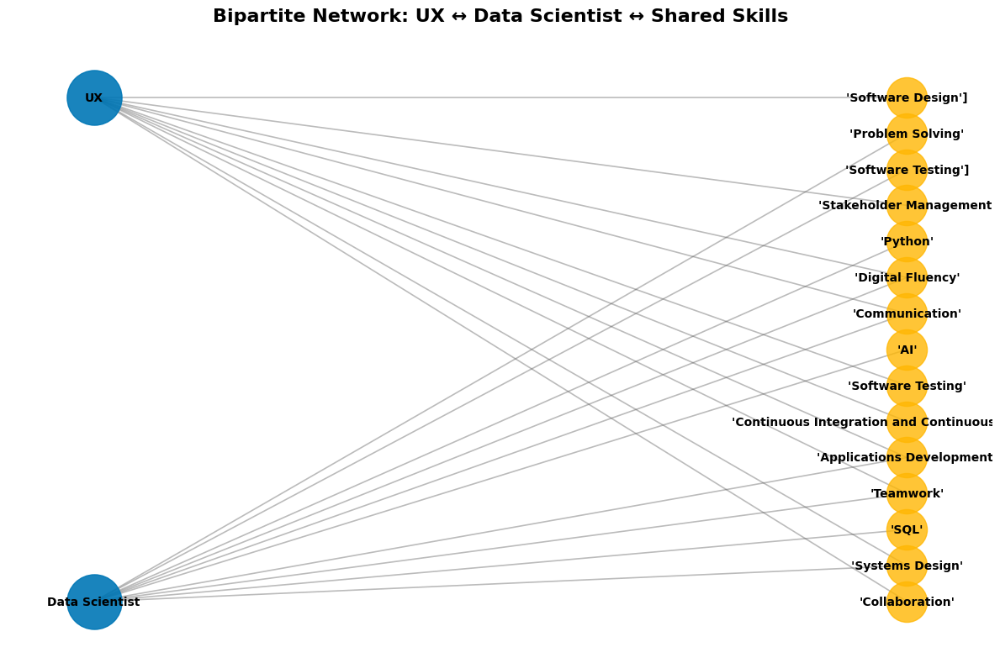

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
from collections import Counter
from itertools import chain

roles_to_plot = ['UX', 'Data Scientist']

df_roles = df_ember[df_ember['Role_Category'].isin(roles_to_plot)].copy()

# Fix: handle NaN and ensure proper list splitting
df_roles['Skill_List'] = (
    df_roles['Consolidated_Skills']
    .fillna('')
    .astype(str)
    .str.split(r',\s*')
)

top_skills_per_role = {}

for role in roles_to_plot:
    skills = list(chain.from_iterable(
        df_roles[df_roles['Role_Category'] == role]['Skill_List']
    ))
    top_skills = [skill for skill, _ in Counter(skills).most_common(10)]
    top_skills_per_role[role] = top_skills
B = nx.Graph()

# Add nodes and edges
for role, skills in top_skills_per_role.items():
    B.add_node(role, bipartite=0)
    for skill in skills:
        B.add_node(skill, bipartite=1)
        B.add_edge(role, skill)
# Separate the two node sets
roles = [n for n, d in B.nodes(data=True) if d['bipartite'] == 0]
skills = [n for n, d in B.nodes(data=True) if d['bipartite'] == 1]

# Stable and spacious bipartite layout
pos = nx.bipartite_layout(B, roles, align='vertical', scale=2.5)

plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(B, pos, nodelist=roles, node_color="#0077b6", node_size=2200, alpha=0.9, label="Roles")
nx.draw_networkx_nodes(B, pos, nodelist=skills, node_color="#ffb703", node_size=1200, alpha=0.8, label="Skills")

nx.draw_networkx_edges(B, pos, width=1.2, alpha=0.4, edge_color="#555555")
nx.draw_networkx_labels(B, pos, font_size=10, font_weight="bold")

plt.title(f"Bipartite Network: {roles_to_plot[0]} ↔ {roles_to_plot[1]} ↔ Shared Skills",
          fontsize=16, fontweight='bold', pad=20)
plt.axis("off")
plt.tight_layout()
plt.show()


In [ ]:
roles_to_plot = ['UX', 'Data Scientist']
df_roles = df_ember[df_ember['Role_Category'].isin(roles_to_plot)]
df_roles['Skill_List'] = df_roles['Consolidated_Skills'].str.split(',\s*')
top_skills_per_role = {}

for role in roles_to_plot:
    skills = list(chain.from_iterable(
        df_roles[df_roles['Role_Category'] == role]['Skill_List']
    ))
    top_skills = [skill for skill, _ in Counter(skills).most_common(10)]
    top_skills_per_role[role] = top_skills
B = nx.Graph()

# Add nodes and edges
for role, skills in top_skills_per_role.items():
    B.add_node(role, bipartite=0)
    for skill in skills:
        B.add_node(skill, bipartite=1)
        B.add_edge(role, skill)
# Separate the two node sets
roles = [n for n, d in B.nodes(data=True) if d['bipartite'] == 0]
skills = [n for n, d in B.nodes(data=True) if d['bipartite'] == 1]

# Stable and spacious bipartite layout
pos = nx.bipartite_layout(B, roles, align='vertical', scale=2.5)

plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(B, pos, nodelist=roles, node_color="#0077b6", node_size=2200, alpha=0.9, label="Roles")
nx.draw_networkx_nodes(B, pos, nodelist=skills, node_color="#ffb703", node_size=1200, alpha=0.8, label="Skills")

nx.draw_networkx_edges(B, pos, width=1.2, alpha=0.4, edge_color="#555555")
nx.draw_networkx_labels(B, pos, font_size=10, font_weight="bold")

plt.title(f"Bipartite Network: {roles_to_plot[0]} ↔ {roles_to_plot[1]} ↔ Shared Skills",
          fontsize=16, fontweight='bold', pad=20)
plt.axis("off")
plt.tight_layout()
plt.show()


<>:3: SyntaxWarning: invalid escape sequence '\s'
<>:3: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipython-input-1180436303.py:3: SyntaxWarning: invalid escape sequence '\s'
  df_roles['Skill_List'] = df_roles['Consolidated_Skills'].str.split(',\s*')
/tmp/ipython-input-1180436303.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_roles['Skill_List'] = df_roles['Consolidated_Skills'].str.split(',\s*')


TypeError: 'float' object is not iterable

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
from collections import Counter
from itertools import chain

roles_to_plot = ['UX', 'Data Scientist']

df_roles = df_ember[df_ember['Role_Category'].isin(roles_to_plot)].copy()

# Fix: handle NaN and ensure proper list splitting
df_roles['Skill_List'] = (
    df_roles['Consolidated_Skills']
    .fillna('')
    .astype(str)
    .str.split(r',\s*')
)

top_skills_per_role = {}

for role in roles_to_plot:
    skills = list(chain.from_iterable(
        df_roles[df_roles['Role_Category'] == role]['Skill_List']
    ))
    top_skills = [skill for skill, _ in Counter(skills).most_common(10)]
    top_skills_per_role[role] = top_skills
B = nx.Graph()

# Add nodes and edges
for role, skills in top_skills_per_role.items():
    B.add_node(role, bipartite=0)
    for skill in skills:
        B.add_node(skill, bipartite=1)
        B.add_edge(role, skill)
# Separate the two node sets
roles = [n for n, d in B.nodes(data=True) if d['bipartite'] == 0]
skills = [n for n, d in B.nodes(data=True) if d['bipartite'] == 1]

# Stable and spacious bipartite layout
pos = nx.bipartite_layout(B, roles, align='vertical', scale=2.5)

plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(B, pos, nodelist=roles, node_color="#0077b6", node_size=2200, alpha=0.9, label="Roles")
nx.draw_networkx_nodes(B, pos, nodelist=skills, node_color="#ffb703", node_size=1200, alpha=0.8, label="Skills")

nx.draw_networkx_edges(B, pos, width=1.2, alpha=0.4, edge_color="#555555")
nx.draw_networkx_labels(B, pos, font_size=10, font_weight="bold")

plt.title(f"Bipartite Network: {roles_to_plot[0]} ↔ {roles_to_plot[1]} ↔ Shared Skills",
          fontsize=16, fontweight='bold', pad=20)
plt.axis("off")
plt.tight_layout()
plt.show()


In [ ]:
roles_to_plot = ['Operations Analyst', 'Data Scientist']
df_roles = df_ember[df_ember['Role_Category'].isin(roles_to_plot)]
df_roles['Skill_List'] = df_roles['Consolidated_Skills'].str.split(',\s*')
top_skills_per_role = {}

for role in roles_to_plot:
    skills = list(chain.from_iterable(
        df_roles[df_roles['Role_Category'] == role]['Skill_List']
    ))
    top_skills = [skill for skill, _ in Counter(skills).most_common(10)]
    top_skills_per_role[role] = top_skills
B = nx.Graph()

# Add nodes and edges
for role, skills in top_skills_per_role.items():
    B.add_node(role, bipartite=0)
    for skill in skills:
        B.add_node(skill, bipartite=1)
        B.add_edge(role, skill)
# Separate the two node sets
roles = [n for n, d in B.nodes(data=True) if d['bipartite'] == 0]
skills = [n for n, d in B.nodes(data=True) if d['bipartite'] == 1]

# Stable and spacious bipartite layout
pos = nx.bipartite_layout(B, roles, align='vertical', scale=2.5)

plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(B, pos, nodelist=roles, node_color="#0077b6", node_size=2200, alpha=0.9, label="Roles")
nx.draw_networkx_nodes(B, pos, nodelist=skills, node_color="#ffb703", node_size=1200, alpha=0.8, label="Skills")

nx.draw_networkx_edges(B, pos, width=1.2, alpha=0.4, edge_color="#555555")
nx.draw_networkx_labels(B, pos, font_size=10, font_weight="bold")

plt.title(f"Bipartite Network: {roles_to_plot[0]} ↔ {roles_to_plot[1]} ↔ Shared Skills",
          fontsize=16, fontweight='bold', pad=20)
plt.axis("off")
plt.tight_layout()
plt.show()


In [ ]:
roles_to_plot = ['Data Analyst', 'Data Scientist']
df_roles = df_ember[df_ember['Role_Category'].isin(roles_to_plot)]
df_roles['Skill_List'] = df_roles['Consolidated_Skills'].str.split(',\s*')
top_skills_per_role = {}

for role in roles_to_plot:
    skills = list(chain.from_iterable(
        df_roles[df_roles['Role_Category'] == role]['Skill_List']
    ))
    top_skills = [skill for skill, _ in Counter(skills).most_common(10)]
    top_skills_per_role[role] = top_skills
B = nx.Graph()

# Add nodes and edges
for role, skills in top_skills_per_role.items():
    B.add_node(role, bipartite=0)
    for skill in skills:
        B.add_node(skill, bipartite=1)
        B.add_edge(role, skill)
# Separate the two node sets
roles = [n for n, d in B.nodes(data=True) if d['bipartite'] == 0]
skills = [n for n, d in B.nodes(data=True) if d['bipartite'] == 1]

# Stable and spacious bipartite layout
pos = nx.bipartite_layout(B, roles, align='vertical', scale=2.5)

plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(B, pos, nodelist=roles, node_color="#0077b6", node_size=2200, alpha=0.9, label="Roles")
nx.draw_networkx_nodes(B, pos, nodelist=skills, node_color="#ffb703", node_size=1200, alpha=0.8, label="Skills")

nx.draw_networkx_edges(B, pos, width=1.2, alpha=0.4, edge_color="#555555")
nx.draw_networkx_labels(B, pos, font_size=10, font_weight="bold")

plt.title(f"Bipartite Network: {roles_to_plot[0]} ↔ {roles_to_plot[1]} ↔ Shared Skills",
          fontsize=16, fontweight='bold', pad=20)
plt.axis("off")
plt.tight_layout()
plt.show()


In [ ]:
roles_to_plot = ['Data Architect', 'Data Scientist']
df_roles = df_ember[df_ember['Role_Category'].isin(roles_to_plot)]
df_roles['Skill_List'] = df_roles['Consolidated_Skills'].str.split(',\s*')
top_skills_per_role = {}

for role in roles_to_plot:
    skills = list(chain.from_iterable(
        df_roles[df_roles['Role_Category'] == role]['Skill_List']
    ))
    top_skills = [skill for skill, _ in Counter(skills).most_common(10)]
    top_skills_per_role[role] = top_skills
B = nx.Graph()

# Add nodes and edges
for role, skills in top_skills_per_role.items():
    B.add_node(role, bipartite=0)
    for skill in skills:
        B.add_node(skill, bipartite=1)
        B.add_edge(role, skill)
# Separate the two node sets
roles = [n for n, d in B.nodes(data=True) if d['bipartite'] == 0]
skills = [n for n, d in B.nodes(data=True) if d['bipartite'] == 1]

# Stable and spacious bipartite layout
pos = nx.bipartite_layout(B, roles, align='vertical', scale=2.5)

plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(B, pos, nodelist=roles, node_color="#0077b6", node_size=2200, alpha=0.9, label="Roles")
nx.draw_networkx_nodes(B, pos, nodelist=skills, node_color="#ffb703", node_size=1200, alpha=0.8, label="Skills")

nx.draw_networkx_edges(B, pos, width=1.2, alpha=0.4, edge_color="#555555")
nx.draw_networkx_labels(B, pos, font_size=10, font_weight="bold")

plt.title(f"Bipartite Network: {roles_to_plot[0]} ↔ {roles_to_plot[1]} ↔ Shared Skills",
          fontsize=16, fontweight='bold', pad=20)
plt.axis("off")
plt.tight_layout()
plt.show()


In [ ]:
roles_to_plot = ['Data Engineer', 'Data Scientist']
df_roles = df_ember[df_ember['Role_Category'].isin(roles_to_plot)]
df_roles['Skill_List'] = df_roles['Consolidated_Skills'].str.split(',\s*')
top_skills_per_role = {}

for role in roles_to_plot:
    skills = list(chain.from_iterable(
        df_roles[df_roles['Role_Category'] == role]['Skill_List']
    ))
    top_skills = [skill for skill, _ in Counter(skills).most_common(10)]
    top_skills_per_role[role] = top_skills
B = nx.Graph()

# Add nodes and edges
for role, skills in top_skills_per_role.items():
    B.add_node(role, bipartite=0)
    for skill in skills:
        B.add_node(skill, bipartite=1)
        B.add_edge(role, skill)
# Separate the two node sets
roles = [n for n, d in B.nodes(data=True) if d['bipartite'] == 0]
skills = [n for n, d in B.nodes(data=True) if d['bipartite'] == 1]

# Stable and spacious bipartite layout
pos = nx.bipartite_layout(B, roles, align='vertical', scale=2.5)

plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(B, pos, nodelist=roles, node_color="#0077b6", node_size=2200, alpha=0.9, label="Roles")
nx.draw_networkx_nodes(B, pos, nodelist=skills, node_color="#ffb703", node_size=1200, alpha=0.8, label="Skills")

nx.draw_networkx_edges(B, pos, width=1.2, alpha=0.4, edge_color="#555555")
nx.draw_networkx_labels(B, pos, font_size=10, font_weight="bold")

plt.title(f"Bipartite Network: {roles_to_plot[0]} ↔ {roles_to_plot[1]} ↔ Shared Skills",
          fontsize=16, fontweight='bold', pad=20)
plt.axis("off")
plt.tight_layout()
plt.show()
